# Pre-requisites

In [ ]:
!pip install datasets transformers torch nltk scipy joblib==1.2.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.5/491.5 kB 32.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 64.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 51.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 50.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 106.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 10.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
!python -m spacy download nb_core_news_md

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 MB 6.5 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('nb_core_news_md')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
target_word = ['bærekraft']

# Drive mount


In [ ]:
from google.colab import drive
import os


drive.mount('/content/drive', force_remount=True)
folder_path = '/content/drive/My Drive/MSc Computer Science/Master Thesis/Annotations'

for f in os.listdir(folder_path):
    print(f)

# Helpers

##Other

In [ ]:
import nltk
from nltk.tokenize import sent_tokenize

nltk.download('punkt')
nltk.download('punkt_tab')

def usages_list(sub_df, ls, target_word):
    for t in sub_df['text']:
        sentences = sent_tokenize(t)

        for s in sentences:
            if any(tw.lower() in s.lower() for tw in target_word):
                ls.append(s.strip())

    return ls

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [ ]:
def get_sentence_from_key(key, usage_lookup):
    if 'general' in key:
        return usage_lookup['general'][key]
    elif 'speaker' in key:
        return usage_lookup['speaker'][key]
    else: print('Error')

In [ ]:
def add_sample_to_usage_graph(usage_graph, speaker_sample, general_sample):
  for k in speaker_sample.keys():
    usage_graph.add_vertex([k])

  for k in general_sample.keys():
    usage_graph.add_vertex([k])

In [ ]:
def generate_joint_sample_per_speaker(speaker_usage_lookup, speaker_corp, general_corp, n, usage_graph):
  speaker_usages = usages_list(speaker_corp, [], target_word)
  general_usages = usages_list(general_corp, [], target_word)
  print('speaker_usages', speaker_usages)
  print('general_usages', general_usages)

  add_to_usage_dict(speaker_usages, speaker_usage_lookup, 'speaker')
  print('add_to_usage_dict, speaker', speaker_usage_lookup)
  add_to_usage_dict(general_usages, speaker_usage_lookup, 'general')
  print('add_to_usage_dict, general', speaker_usage_lookup)

  speaker_random_sample = random_sample_usages(speaker_usage_lookup, 'speaker', n)
  print('speaker_random_sample', speaker_random_sample)
  general_random_sample = random_sample_usages(speaker_usage_lookup, 'general', n)
  print('general_random_sample', general_random_sample)

  add_sample_to_usage_graph(usage_graph, speaker_random_sample, general_random_sample)
  print('usage_graph vertices', usage_graph.get_vertices())

  return speaker_random_sample, general_random_sample

In [ ]:
import pandas as pd

def generate_speaker_and_general_corpus_within_timeframe(df, speaker_dict, name):
    df_copy = df.copy()
    speaker_corp = speaker_dict[name]

    speaker_years = speaker_corp['date'].dt.year.unique()
    print('speaker years', speaker_years)

    # filtrer ut rader med andre navn, men som er i samme år
    general_corp = df_copy[
        (df_copy['name'] != name) &
        (df_copy['date'].dt.year.isin(speaker_years))
    ]

    return general_corp, speaker_corp

In [ ]:
import random

def random_sample_usages(usage_dict, time_group, n):
    random.seed(42)

    keys = list(usage_dict[time_group].keys())
    sampled_keys = random.sample(keys, n)

    return {k: usage_dict[time_group][k] for k in sampled_keys}

In [ ]:
def add_to_usage_dict(usages, usage_lookup, group):
    if group not in usage_lookup:
        usage_lookup[group] = {}

    start_index = len(usage_lookup[group])

    for i, sentence in enumerate(usages, start=start_index):
        usage_lookup[group][f"u{i}_{group}"] = sentence


In [ ]:
def add_annotation_pair(annotation_dict, round_num, usage1, usage2, annotation):
    if round_num not in annotation_dict:
        annotation_dict[round_num] = {}

    pair = tuple(sorted([usage1, usage2]))

    annotation_dict[round_num][pair] = annotation


##Graph and clustering

In [ ]:
class Graph:
    def __init__(self, gdict=None):
        if gdict is None:
            gdict = {}
        self.gdict = gdict
        self.edge_weights = {}  # {(u1, u2): weight}

    def add_vertex(self, vertices):
        for v in vertices:
            if v not in self.gdict:
                self.gdict[v] = []

    def add_edge(self, v, neighbors, weight=None):
        for ne in neighbors:
            # add v -> neighbor
            if v not in self.gdict:
                self.gdict[v] = []
            if ne not in self.gdict[v]:
                self.gdict[v].append(ne)

            # add neighbor -> v (undirected)
            if ne not in self.gdict:
                self.gdict[ne] = []
            if v not in self.gdict[ne]:
                self.gdict[ne].append(v)

            if weight is not None:
                pair = tuple(sorted([v, ne])) # sorted pair
                self.edge_weights[pair] = weight

    def get_edges(self):
        seen = set()
        edges = []
        for v in self.gdict:
            for ne in self.gdict[v]:
                pair = tuple(sorted([v, ne]))
                if pair not in seen:
                    seen.add(pair)
                    edges.append(pair)
        return edges

    def get_vertices(self):
        return list(self.gdict.keys())

    def get_edge_weight(self, u1, u2):
        return self.edge_weights.get(tuple(sorted([u1, u2])))

    def add_edges_from_annotation_dict(self, annotation_dict, round_number):
        if round_number in annotation_dict:
            for (u1, u2), weight in annotation_dict[round_number].items():
                self.add_edge(u1, [u2], weight)


In [ ]:
def add_clusters_to_dict(clusters_dict, round_number, list_clusters):
    if round_number not in clusters_dict:
        clusters_dict[round_number] = {}

    existing_count = sum(
        len(clusters_dict[round_number].get(k, {}))
        for k in ['singles', 'multi_clusters']
    )

    for cluster in list_clusters:
        cluster_type = 'multi_clusters' if len(cluster) >= 2 else 'singles'
        if cluster_type not in clusters_dict[round_number]:
            clusters_dict[round_number][cluster_type] = {}
        cluster_id = f'c{existing_count + 1}'
        clusters_dict[round_number][cluster_type][cluster_id] = cluster
        existing_count += 1


In [ ]:
import random

def generate_missing_comparisons(usage_graph, clusters_dict, annotation_dict, round_number, seed=42):
    random.seed(seed)
    comparison_tuples = []

    all_annotated = set()
    for round_edges in annotation_dict.values():
        for u, v in round_edges:
            all_annotated.add(tuple(sorted((u, v))))

    round_data = clusters_dict.get(round_number)

    if not round_data:
        return comparison_tuples

    multi_clusters = list(round_data.get('multi_clusters', {}).values())
    singles_clusters = list(round_data.get('singles', {}).values())
    single_vertices = set().union(*singles_clusters) if singles_clusters else set()

    for node in usage_graph.get_vertices():
        if not usage_graph.gdict[node]:
            for mc in multi_clusters:
                m = random.choice(list(mc))
                pair = tuple(sorted((node, m)))
                if node != m and pair not in comparison_tuples and pair not in all_annotated:
                    comparison_tuples.append(pair)

    for s in single_vertices:
        for mc in multi_clusters:
            m = random.choice(list(mc))
            pair = tuple(sorted((s, m)))
            if s != m and pair not in comparison_tuples and pair not in all_annotated:
                comparison_tuples.append(pair)

    return comparison_tuples


In [ ]:
def pair_usages_with_text(tuple_list, usage_lookup):
    result = []
    for u1, u2 in tuple_list:
        try:
            sent1 = get_sentence_from_key(u1, usage_lookup)
            sent2 = get_sentence_from_key(u2, usage_lookup)
            result.append(((u1, sent1), (u2, sent2)))
        except KeyError as e:
            print(f"Missing usage for: {e}")
    return result


In [ ]:
def add_annotations_from_df_to_dict(df, annotation_dict, round_number):
    for _, row in df.iterrows():
        if row['round'] == round_number:
            u1 = row['usage_1_id']
            u2 = row['usage_2_id']
            anno = row['anno']
            add_annotation_pair(annotation_dict, round_number, u1, u2, anno)


In [ ]:
from itertools import combinations
import random

def sample_non_assigned_singletons(clusters_dict, annotation_dict, round_number):
    random.seed(42)

    singles = clusters_dict[round_number]['singles']
    singleton_usages = [next(iter(usages)) for usages in singles.values()]

    if len(singleton_usages) < 2:
        return []

    all_annotated = set()
    for round_edges in annotation_dict.values():
        for u, v in round_edges:
            all_annotated.add(tuple(sorted([u, v])))


    all_possible_edges = [
        tuple(sorted((u, v)))
        for u, v in combinations(singleton_usages, 2)
        if tuple(sorted((u, v))) not in all_annotated
    ]
    random.shuffle(all_possible_edges)

    # greedy spanning tree
    parent = {node: node for node in singleton_usages}

    def find(x):
        while parent[x] != x:
            parent[x] = parent[parent[x]]
            x = parent[x]
        return x

    def union(x, y):
        parent[find(x)] = find(y)

    new_edges = []
    for u, v in all_possible_edges:
        if find(u) != find(v):
            union(u, v)
            new_edges.append((u, v))
        if len(new_edges) == len(singleton_usages) - 1:
            break

    return new_edges


In [ ]:
import random

def find_conflicting_edges(graph, clusters_dict, round_number, shift=2.5):
    round_clusters = clusters_dict.get(round_number, {})
    singles = round_clusters.get('singles', {}).values()
    multi_clusters = round_clusters.get('multi_clusters', {}).values()

    all_clusters = list(singles) + list(multi_clusters)

    vertex_to_cluster = {}
    for idx, cluster in enumerate(all_clusters):
        for vertex in cluster:
            vertex_to_cluster[vertex] = idx

    conflicts = set()

    for u, v in graph.get_edges():
        w = graph.get_edge_weight(u, v)
        print('current weight considered on edge u, v', w, u, v)

        if pd.isna(w):
            continue

        try:
            w = float(w)
        except (ValueError, TypeError):
            continue

        shifted = w - shift
        same_cluster = vertex_to_cluster.get(u) == vertex_to_cluster.get(v)

        if same_cluster and shifted < 0:
            conflicts.add((u, v))
        elif not same_cluster and shifted >= 0:
            conflicts.add((u, v))

    return conflicts



def sample_new_edges_from_conflicting_nodes(graph, clusters_dict, annotation_dict, round_number):
    random.seed(42)

    conflicts = find_conflicting_edges(graph, clusters_dict, round_number)
    nodes_in_conflict = {u for edge in conflicts for u in edge}


    all_annotated = set()
    for round_data in annotation_dict.values():
        for u, v in round_data:
            all_annotated.add(tuple(sorted([u, v])))

    # sample new edge for each conflicting node
    all_nodes = graph.get_vertices()
    sampled_edges = []

    for node in nodes_in_conflict:
        candidates = [
            other for other in all_nodes
            if other != node and tuple(sorted([node, other])) not in all_annotated
        ]
        if candidates:
            chosen = random.choice(candidates)
            sampled_edges.append(tuple(sorted([node, chosen])))

    return sampled_edges


In [ ]:
import random
from itertools import combinations

def sample_edges_from_multiclusters(clusters_dict, annotation_dict, round_number, pairs_per_cluster=1):
    random.seed(42)

    sampled_edges = []

    multi_clusters = clusters_dict[round_number]['multi_clusters']


    all_annotated = set()
    for round_dict in annotation_dict.values():
        for u, v in round_dict:
            all_annotated.add(tuple(sorted([u, v])))

    for cluster_nodes in multi_clusters.values():
        cluster = list(cluster_nodes)
        if len(cluster) < 2:
            continue

        possible_pairs = list(combinations(cluster, 2))
        random.shuffle(possible_pairs)

        count = 0
        for u, v in possible_pairs:
            pair = tuple(sorted([u, v]))
            if pair not in all_annotated:
                print('pair not annotated', pair)
                sampled_edges.append(pair)
                count += 1
                if count == pairs_per_cluster:
                    break

    return sampled_edges


In [ ]:
def heuristic_sampling(graph, clusters_dict, annotation_dict, round_number, already_selected, pairs_per_cluster, seed=42):
    random.seed(seed)

    seen_edges = {tuple(sorted(pair)) for pair in already_selected}
    all_sampled_edges = []

    multi_cluster_edges = sample_edges_from_multiclusters(
        clusters_dict=clusters_dict,
        annotation_dict=annotation_dict,
        round_number=round_number,
        pairs_per_cluster=pairs_per_cluster
    )
    for edge in multi_cluster_edges:
        pair = tuple(sorted(edge))
        if pair not in seen_edges:
            all_sampled_edges.append(pair)
            seen_edges.add(pair)

    conflict_based_edges = sample_new_edges_from_conflicting_nodes(
        graph=graph,
        clusters_dict=clusters_dict,
        annotation_dict=annotation_dict,
        round_number=round_number
    )
    for edge in conflict_based_edges:
        pair = tuple(sorted(edge))
        if pair not in seen_edges:
            all_sampled_edges.append(pair)
            seen_edges.add(pair)

    return all_sampled_edges


In [ ]:
def add_annotation_from_df_to_dict_and_graph(df, graph, annotation_dict, round_number):
    add_annotations_from_df_to_dict(df, annotation_dict, round_number)
    graph.add_edges_from_annotation_dict(annotation_dict, round_number)

In [ ]:
def add_comparisons_to_df_given_round(df, comparison_tuples, round_number, usage_lookup):
    new_rows = []
    for u1, u2 in comparison_tuples:
        new_rows.append({
            'round': round_number,
            'usage_1_id': u1,
            'usage_1_text': get_sentence_from_key(u1, usage_lookup),
            'usage_2_id': u2,
            'usage_2_text': get_sentence_from_key(u2, usage_lookup),
            'anno': ''
        })
    return pd.concat([df, pd.DataFrame(new_rows)], ignore_index=True)


In [ ]:
def next_round_pairs_to_excel(df, usage_graph, usage_lookup, annotation_dict, clusters_dict, round_number, pairs_per_cluster=2):
    next_round_number = round_number + 1

    clusters_prev, loss_prev = optimize_clusters_mlrose(usage_graph, max_clusters=30, runs_per_k=20)
    print("prev_clusters", clusters_prev)
    print("prev_loss", loss_prev)

    add_clusters_to_dict(clusters_dict, round_number, clusters_prev)
    print("cd", clusters_dict)

    comb = generate_missing_comparisons(usage_graph, clusters_dict, annotation_dict, round_number)
    print("comb", comb)
    print("len comb", len(comb))

    expl = []
    if 'singles' in clusters_dict.get(round_number, {}):
        expl = sample_non_assigned_singletons(clusters_dict, annotation_dict, round_number)
    print("expl", expl)
    print("len expl", len(expl))

    comb_and_expl = comb + expl
    print("comb_and_expl", comb_and_expl)
    print("len comb_and_expl", len(comb_and_expl))

    heur_sampling = heuristic_sampling(usage_graph, clusters_dict, annotation_dict, round_number, comb_and_expl, pairs_per_cluster)
    print("heur_sampling", heur_sampling)
    print("len heur_sampling", len(heur_sampling))

    all_pairs = comb_and_expl + heur_sampling
    print("all_pairs", all_pairs)
    print("len all_pairs", len(all_pairs))

    df = add_comparisons_to_df_given_round(df, all_pairs, next_round_number, usage_lookup)
    print("df", df)

    df.to_excel(f"t_sn_annotation_r{next_round_number}.xlsx", index=False)

    return df, all_pairs


## Networkx and Simulated Annealing

In [ ]:
!pip install mlrose-hiive

In [ ]:
#!pip install joblib==1.2.0

In [ ]:
import mlrose_hiive as mlrose
import pandas as pd
import numpy as np

def create_fitness_fn(graph, shift=2.5):
    vertices = list(set(u for u, v in graph.get_edges()).union(v for u, v in graph.get_edges()))

    def fitness(state):
        cluster_assignments = {v: state[i] for i, v in enumerate(vertices)}
        positive_between = 0
        negative_within = 0

        for u, v in graph.get_edges():
            original_weight = graph.get_edge_weight(u, v)

            if pd.isna(original_weight):
                continue
            try:
                original_weight = float(original_weight)
            except (ValueError, TypeError):
                continue

            shifted_weight = original_weight - shift
            same_cluster = cluster_assignments[u] == cluster_assignments[v]

            if same_cluster and shifted_weight < 0:
                negative_within += abs(shifted_weight)
            elif not same_cluster and shifted_weight >= 0:
                positive_between += shifted_weight

        return positive_between + negative_within

    return fitness, vertices

def optimize_with_mlrose(graph, num_clusters=3, max_iter=10000):
    np.random.seed(42)

    fitness_fn, vertices = create_fitness_fn(graph)
    custom_fitness = mlrose.CustomFitness(fitness_fn)

    problem = mlrose.DiscreteOpt(length=len(vertices),
                                 fitness_fn=custom_fitness,
                                 maximize=False,
                                 max_val=num_clusters)

    best_state, best_loss, _ = mlrose.simulated_annealing(problem,
                                                       schedule=mlrose.ExpDecay(),
                                                       max_attempts=100,
                                                       max_iters=max_iter,
                                                       init_state=None)

    # convert flat state vector back to clusters
    clusters = [[] for _ in range(num_clusters)]
    for i, cluster_id in enumerate(best_state):
        clusters[cluster_id].append(vertices[i])

    non_empty_clusters = [set(cluster) for cluster in clusters if cluster]

    return non_empty_clusters, best_loss

def optimize_clusters_mlrose(graph, max_clusters=5, runs_per_k=3, max_iter=10000):
    best_clusters = None
    best_loss = float('inf')

    for k in range(2, max_clusters + 1):
        for _ in range(runs_per_k):
            clusters, loss = optimize_with_mlrose(graph, num_clusters=k, max_iter=max_iter)
            if loss < best_loss:
                best_loss = loss
                best_clusters = clusters

    return best_clusters, best_loss


# Corpus

## Pre-processing

In [ ]:
!pip install --upgrade datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.5/491.5 kB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.6/193.6 kB 17.9 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2025.3.2
    Uninstalling fsspec-2025.3.2:
      Successfully uninstalled fsspec-2025.3.2
  Attempting uninstall: datasets
    Found existing installation: datasets 2.14.4
    Uninstalling datasets-2.14.4:
      Successfully uninstalled datasets-2.14.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2025.3.2 requires fsspec==2025.3.2, but you have fsspec 2025.3.0 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cublas-cu12==12.4.5.8; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cublas-cu12 12.5.3.2 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cuda-cupti-cu12==12.4.127; pl

In [ ]:
from datasets import load_dataset

ds_n = load_dataset("trymtv/norwegian-parliament-speeches", split="train")
ds_n

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/455 [00:00<?, ?B/s]

parliament_speeches.csv:   0%|          | 0.00/535M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/274204 [00:00<?, ? examples/s]

Dataset({
    features: ['name', 'sex', 'party', 'text', 'date'],
    num_rows: 274204
})

In [ ]:
df_n = ds_n.to_pandas()

In [ ]:
import pandas as pd

df_n['date'] = pd.to_datetime(df_n['date'])
df_n['time_group'] = df_n['date'].apply(lambda x: 1 if x.year >= 1998 and x.year <= 2010 else 2)
df_n[:10]

,name,sex,party,text,date,time_group
0,Laila Dåvøy,F,Kristelig Folkeparti,Jeg har gleden av å fremme et representantfors...,2013-04-17,2
1,Laila Dåvøy,F,Kristelig Folkeparti,La meg komme med et femte eksempel på sendrekt...,2013-04-17,2
2,Dagrun Eriksen,F,Kristelig Folkeparti,Det er en ære å fremme et forslag på vegne av ...,2013-04-17,2
3,Dagrun Eriksen,F,Kristelig Folkeparti,Det er ikke tvil om at veiprosjekter ikke har ...,2013-04-17,2
4,Dagrun Eriksen,F,Kristelig Folkeparti,Jeg har et spørsmål til kirkeministeren. Kirke...,2013-04-17,2
5,Dagrun Eriksen,F,Kristelig Folkeparti,Det kan jo bli en interessant valgkamp hvis al...,2013-04-17,2
6,Dagrun Eriksen,F,Kristelig Folkeparti,La meg først få lov til å si til statsrådens s...,2013-04-17,2
7,Robert Eriksson,M,Fremskrittspartiet,Jeg har gleden av på vegne av representantene ...,2013-04-17,2
8,Robert Eriksson,M,Fremskrittspartiet,"Når jeg hører på statsrådens svar, er det tyde...",2013-04-17,2
9,Gjermund Hagesæter,M,Fremskrittspartiet,På vegner av stortingsrepresentantane Per Sand...,2013-04-17,2


In [ ]:
tg1_df = df_n[df_n['time_group'] == 1]
tg2_df = df_n[df_n['time_group'] == 2]

tg1 (132068, 6)
tg2 (142136, 6)


## Diachronic

In [ ]:
clusters_dict = {}
annotation_dict = {}
usage_graph = Graph()

### Set dicts and usage_graph

In [ ]:
usage_lookup = {}

In [ ]:
tg1_usages = []
usages_list(tg1_df, tg1_usages, target_word)
print(len(tg1_usages))

3084


In [ ]:
tg2_usages = []
usages_list(tg2_df, tg2_usages, target_word)
print(len(tg2_usages))

7436


In [ ]:
add_to_usage_dict(tg1_usages, usage_lookup, 'tg1')
add_to_usage_dict(tg2_usages, usage_lookup, 'tg2')

In [ ]:
usage_lookup

{'tg1': {'u0_tg1': 'Det betyr jo at vi i denne runden taper, men etter mitt skjønn vil vårt avgiftssystem, hvis det skal være bærekraftig inn i neste århundre, måtte legges i retning av seteavgift – den typen avgift som gjør at man rett og slett går i grønn retning og ikke i den motsatte retning.',
  'u1_tg1': 'For Per-Kristian Foss – i likhet med de fleste – vil jo se at skal vi ha et bærekraftig avgiftssystem, må det også innbefatte internasjonal luftfart, som internasjonal transport i sin alminnelighet.',
  'u2_tg1': 'Vi går nå inn i den tredje fasen av energialderen i Norge – først gikk vi fra vann til olje og gass, og nå må vi gå fra olje og gass til å utvikle ny bærekraftig energi også for vår industri.',
  'u3_tg1': 'Det finnes mange muligheter til å utvikle det, og det ser vi ikke minst i våre naboland Sverige og Danmark, som begge er betydelige nettoeksportører av bærekraftig energiteknologi.',
  'u4_tg1': 'Men for SV er allikevel det viktigste perspektivet som her er trukket 

In [ ]:
tg1_random_sample = random_sample_usages(usage_lookup, 'tg1', 30)
tg2_random_sample = random_sample_usages(usage_lookup, 'tg2', 30)

In [ ]:
tg1_random_sample

{'u2619_tg1': 'Men vi har en finansminister som ønsker å gjøre noe med det, og som vil bringe den problemstillingen som er reist i denne interpellasjonen, inn i høringen om indikatorer for en bærekraftig utvikling og i det arbeidet som skal følge videre etter det, fram mot framtidige nasjonalbudsjetter.',
 'u456_tg1': 'Møtet vil sette fokus på nordisk bærekraftig utvikling samt presentere perspektiver på det nordiske forslaget fra inviterte gjester.',
 'u102_tg1': '51 for 1997-98, Perspektiver på utvikling av norsk fiskerinæring, starter med å slå fast at fiskeripolitikken skal legge til rette for en lønnsom utvikling av fiskerinæringen, og at en bærekraftig og langsiktig ressursforvaltning er en av forutsetningene for å få til dette.',
 'u3037_tg1': 'Klarer vi ikke å få bukt med det, blir på en måte alle de andre fiskeripolitiske debattene litt underordnet, for det å ta vare på og sørge for en bærekraftig forvaltning er fundamentet for alt de vi holder på med.',
 'u1126_tg1': 'Jeg vil

In [ ]:
len(tg2_random_sample)

30

In [ ]:
usage_graph = Graph()

for k in tg1_random_sample.keys():
  usage_graph.add_vertex([k])

for k in tg2_random_sample.keys():
  usage_graph.add_vertex([k])


In [ ]:
#usage_graph.get_vertices()

In [ ]:
number_of_vertices = len(usage_graph.get_vertices())
print(number_of_vertices) # should be 60

### TC: Round 1

In [ ]:
import random

random.seed(42)
r1_sample = random.sample(usage_graph.get_vertices(), 6)

r1_sample

In [ ]:
add_annotation_from_df_to_dict_and_graph(df, usage_graph, annotation_dict, 1)
annotation_dict

In [ ]:
usage_graph.get_edges()

In [ ]:
df, r2_all_pairs = next_round_pairs_to_excel(df, usage_graph, annotation_dict, clusters_dict, 1)

### TC: Round 2

In [ ]:
df = pd.read_excel('Annotations_temporal-comparison_r2.xlsx')
df

In [ ]:
add_annotation_from_df_to_dict_and_graph(df, usage_graph, annotation_dict, 2)

In [ ]:
df, r3_all_pairs = next_round_pairs_to_excel(df, usage_graph, annotation_dict, clusters_dict, 2)

###TC: Round 3

In [ ]:
df = pd.read_excel('Annotations_temporal-comparison_r3.xlsx')
df

In [ ]:
add_annotation_from_df_to_dict_and_graph(df, usage_graph, annotation_dict, 3)

In [ ]:
df, r4_all_pairs = next_round_pairs_to_excel(df, usage_graph, annotation_dict, clusters_dict, 3)

### TC: Round 4

In [ ]:
df = pd.read_excel('Annotations_temporal-comparison_r4.xlsx')
df

In [ ]:
add_annotation_from_df_to_dict_and_graph(df, usage_graph, annotation_dict, 4)

In [ ]:
df, _ = next_round_pairs_to_excel(df, usage_graph, annotation_dict, clusters_dict, 4)

## General-use corpus & Speaker sub-corpus

In [ ]:
target_word = ['bærekraft']

In [ ]:
sub_corpora_n = {name: group for name, group in df_n.groupby('name')}

### Speaker 1

In [ ]:
general_corp_speaker1, speaker1_corp = generate_speaker_and_general_corpus_within_timeframe(df_n, sub_corpora_n, 'Frank Bakke-Jensen')

speaker years [2013 2020 2019 2015 2012 2021 2010 2018 2014 2017 2009 2016 2011]


In [ ]:
speaker1_usage_lookup = {}

In [ ]:
s1_usage_graph = Graph()
s1_clusters_dict = {}
s1_annotation_dict = {}

In [ ]:
speaker1_sample, general1_sample = generate_joint_sample_per_speaker(speaker1_usage_lookup, speaker1_corp, general_corp_speaker1, 30, s1_usage_graph)

speaker_usages ['Det er regjeringens ambisjon å sikre tydelig nasjonal tilstedeværelse, bærekraftig forvaltning av naturressursene, styrking av miljøvernberedskap og utbygging av infrastruktur.', 'Regjeringen har som mål å utvikle Nord-Norge til å bli en av Norges mest skapende og bærekraftige regioner.', 'Derfor blir formuleringen om å lage en helhetlig forvaltnings- og utviklingsplan for en bærekraftig utnyttelse av naturressursene viktig.', 'Vi tror også at kravet om bærekraftig vekst best oppnås ved at man tilrettelegger for forutsigbar vekst.', 'Vi tror også at kravet om bærekraftig vekst oppnås best ved at man tilrettelegger for forutsigbar vekst.', 'Bærekraft hegner vi også om ved å framføre prinsippet om at hver forurenser betaler.', 'Dette virker etter vår mening mer preventivt, og setter høyere krav til den enkelte om å oppfylle bærekraftskriteriene.', 'I et bærekraftperspektiv snakker man om økonomisk bærekraft, økologisk bærekraft – gjerne sosial bærekraft.', 'Når det gjeld

In [ ]:
s1_usage_graph.get_vertices()

['u163_speaker',
 'u28_speaker',
 'u6_speaker',
 'u189_speaker',
 'u70_speaker',
 'u62_speaker',
 'u57_speaker',
 'u35_speaker',
 'u188_speaker',
 'u26_speaker',
 'u173_speaker',
 'u139_speaker',
 'u22_speaker',
 'u151_speaker',
 'u108_speaker',
 'u8_speaker',
 'u7_speaker',
 'u23_speaker',
 'u55_speaker',
 'u59_speaker',
 'u129_speaker',
 'u154_speaker',
 'u195_speaker',
 'u143_speaker',
 'u50_speaker',
 'u166_speaker',
 'u186_speaker',
 'u107_speaker',
 'u56_speaker',
 'u114_speaker',
 'u5238_general',
 'u912_general',
 'u204_general',
 'u6074_general',
 'u2253_general',
 'u2006_general',
 'u1828_general',
 'u1143_general',
 'u6033_general',
 'u839_general',
 'u5543_general',
 'u6067_general',
 'u7308_general',
 'u4467_general',
 'u712_general',
 'u4837_general',
 'u3456_general',
 'u260_general',
 'u244_general',
 'u767_general',
 'u1791_general',
 'u1905_general',
 'u4139_general',
 'u4931_general',
 'u217_general',
 'u4597_general',
 'u1628_general',
 'u5865_general',
 'u5323_gene

#### Round 1

In [ ]:
import random

random.seed(42)
s1_r1_sample = random.sample(s1_usage_graph.get_vertices(), 6)

s1_r1_sample

In [ ]:
for u in s1_r1_sample:
  print(f"{u} | ",get_sentence_from_key(u, speaker1_usage_lookup))

In [ ]:
import pandas as pd

filename = 't_s1_annotation_r1.xlsx'
folder_path = '/content/drive/My Drive/MSc Computer Science/Master Thesis/Annotations/'

df = pd.read_excel(folder_path + filename)
df

In [ ]:
add_annotation_from_df_to_dict_and_graph(df, s1_usage_graph, s1_annotation_dict, 1)
s1_annotation_dict

NameError: name 's1_usage_graph' is not defined

In [ ]:
df, s1_r2_all_pairs = next_round_pairs_to_excel(df, s1_usage_graph, speaker1_usage_lookup, s1_annotation_dict, s1_clusters_dict, 1)

#### Round 2

In [ ]:
import pandas as pd

filename = 't_s1_annotation_r2.xlsx'
folder_path = '/content/drive/My Drive/MSc Computer Science/Master Thesis/Annotations/'

df = pd.read_excel(folder_path + filename)
df

In [ ]:
add_annotation_from_df_to_dict_and_graph(df, s1_usage_graph, s1_annotation_dict, 2)
s1_annotation_dict

In [ ]:
df, s1_r3_all_pairs = next_round_pairs_to_excel(df, s1_usage_graph, speaker1_usage_lookup, s1_annotation_dict, s1_clusters_dict, 2)

#### Round 3

In [ ]:
import pandas as pd

filename = 't_s1_annotation_r3.xlsx'
folder_path = '/content/drive/My Drive/MSc Computer Science/Master Thesis/Annotations/'

df = pd.read_excel(folder_path + filename)
df

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/My Drive/MSc Computer Science/Master Thesis/t_s1_annotation_r3.xlsx'

In [ ]:
add_annotation_from_df_to_dict_and_graph(df, s1_usage_graph, s1_annotation_dict, 3)
s1_annotation_dict

In [ ]:
df, s1_r4_all_pairs = next_round_pairs_to_excel(df, s1_usage_graph, speaker1_usage_lookup, s1_annotation_dict, s1_clusters_dict, 3)

#### Round 4

In [ ]:
import pandas as pd

filename = 't_s1_annotation_r4.xlsx'
folder_path = '/content/drive/My Drive/MSc Computer Science/Master Thesis/Annotations/'

df = pd.read_excel(folder_path + filename)
df

In [ ]:
#add_annotation_from_df_to_dict_and_graph(df, s1_usage_graph, s1_annotation_dict, 1)
#add_annotation_from_df_to_dict_and_graph(df, s1_usage_graph, s1_annotation_dict, 2)
#add_annotation_from_df_to_dict_and_graph(df, s1_usage_graph, s1_annotation_dict, 3)
add_annotation_from_df_to_dict_and_graph(df, s1_usage_graph, s1_annotation_dict, 4)
s1_annotation_dict

In [ ]:
df, _ = next_round_pairs_to_excel(df, s1_usage_graph, speaker1_usage_lookup, s1_annotation_dict, s1_clusters_dict, 4)

### Speaker 2

In [ ]:
general_corp_speaker2, speaker2_corp = generate_speaker_and_general_corpus_within_timeframe(df_n, sub_corpora_n, 'Rigmor Andersen Eide')

speaker years [2013 2001 2003 2015 2002 2012 2010 2014 2017 2009 2016 2011 2004]


In [ ]:
s2_clusters_dict = {}
s2_annotation_dict = {}
s2_usage_graph = Graph()

In [ ]:
speaker2_usage_lookup = {}
speaker2_sample, general2_sample = generate_joint_sample_per_speaker(speaker2_usage_lookup, speaker2_corp, general_corp_speaker2, 30, s2_usage_graph)

speaker_usages ['Kristelig Folkepartis gjennomslag i dette budsjettet og i samarbeidsavtalen med Solberg-regjeringa vil bidra til å gjøre Norge til et mer bærekraftig og klimavennlig samfunn på sikt.', 'Det helt grunnleggende og totalt avgjørende er en langsiktig og bærekraftig forvaltning av fiskeressursene.', 'Jeg vil oppsummere med at det budsjettet vi i dag får vedtatt, legger til rette for en fiskeri- og havbrukspolitikk som vil bidra til økt verdiskaping i en lønnsom og bærekraftig fiskeri- og havbruksnæring.', 'Jeg tror det er vanskelig å få stor nok oppmerksomhet rundt utfordringene forbundet med en bærekraftig utvikling og en bærekraftig forvaltning av ressursene sett under ett.', 'Slike planer og oppfølgingen av disse er med på å legge grunnlaget for nettopp å oppnå målet om en bærekraftig utvikling.', 'Vi har fått et budsjett som legger til rette for arbeid til alle, økt verdiskapning, rettferdig fordeling og bærekraftig utvikling.', 'Når det gjelder fiskeriforvaltningen, er

In [ ]:
#speaker2_usage_lookup

#### Round 1

In [ ]:
import random

random.seed(10)
s2_r1_sample = random.sample(s2_usage_graph.get_vertices(), 6)

s2_r1_sample

['u1143_general',
 'u70_speaker',
 'u130_speaker',
 'u5238_general',
 'u2278_general',
 'u28_speaker']

In [ ]:
for u in s2_r1_sample:
  print(f"{u} | ",get_sentence_from_key(u, speaker2_usage_lookup))

u1143_general |  Vi skal bevare de tradisjonene som har gjort vårt arbeidsliv mulig å skape, og vi skal sikre at disse tradisjonene er bærekraftige for framtiden.
u70_speaker |  kr utover regjeringens forslag til forskning og teknologiutvikling for bærekraftig fiskeoppdrett under rammeområde 16.
u130_speaker |  De var for så vidt enig i at vi skal forvalte bestanden på en bærekraftig måte, men det var ingen forståelse for at de fisket på en felles bestand.
u5238_general |  EU-kommisjonen la den 10. november 2010 fram et dokument med tittelen «Energi 2020 – En strategi for konkurransekraftig, bærekraftig og sikker energi».
u2278_general |  Mener finansministeren at jo større Statens pensjonsfond blir, jo bedre er det for Norge, jo større Statens pensjonsfond blir, jo lysere fremtid er det for Norge, og jo større Statens pensjonsfond blir, jo mer bærekraftig vil Norges finansielle situasjon være?
u28_speaker |  Indikatorene for og arbeidet med bærekraft må videreutvikles og må bli tydeli

In [ ]:
import pandas as pd

filename = 't_s2_annotations_r1.xlsx'
folder_path = '/content/drive/My Drive/MSc Computer Science/Master Thesis/Annotations/'

df = pd.read_excel(folder_path + filename)
df

,round,usage_1_id,usage_1_text,usage_2_id,usage_2_text,anno
0,1,u1143_general,NaN,u70_speaker,NaN,3
1,1,u70_speaker,NaN,u130_speaker,NaN,4
2,1,u130_speaker,NaN,u5238_general,NaN,2
3,1,u5238_general,NaN,u2278_general,NaN,2
4,1,u2278_general,NaN,u28_speaker,NaN,3


In [ ]:
add_annotation_from_df_to_dict_and_graph(df, s2_usage_graph, s2_annotation_dict, 1)
s2_annotation_dict

{1: {('u1143_general', 'u70_speaker'): 3,
  ('u130_speaker', 'u70_speaker'): 4,
  ('u130_speaker', 'u5238_general'): 2,
  ('u2278_general', 'u5238_general'): 2,
  ('u2278_general', 'u28_speaker'): 3}}

In [ ]:
df, s2_r2_all_pairs = next_round_pairs_to_excel(df, s2_usage_graph, speaker2_usage_lookup, s2_annotation_dict, s2_clusters_dict, 1, pairs_per_cluster=2)

prev_clusters [{'u2278_general', 'u28_speaker', 'u70_speaker', 'u1143_general', 'u130_speaker'}, {'u5238_general'}]
prev_loss 0
cd {1: {'multi_clusters': {'c1': {'u2278_general', 'u28_speaker', 'u70_speaker', 'u1143_general', 'u130_speaker'}}, 'singles': {'c2': {'u5238_general'}}}}
comb [('u2278_general', 'u6_speaker'), ('u2278_general', 'u62_speaker'), ('u57_speaker', 'u70_speaker'), ('u28_speaker', 'u35_speaker'), ('u26_speaker', 'u28_speaker'), ('u22_speaker', 'u28_speaker'), ('u108_speaker', 'u2278_general'), ('u130_speaker', 'u4_speaker'), ('u2278_general', 'u3_speaker'), ('u11_speaker', 'u130_speaker'), ('u1143_general', 'u27_speaker'), ('u2278_general', 'u29_speaker'), ('u2278_general', 'u64_speaker'), ('u2278_general', 'u77_speaker'), ('u125_speaker', 'u28_speaker'), ('u28_speaker', 'u71_speaker'), ('u130_speaker', 'u25_speaker'), ('u130_speaker', 'u91_speaker'), ('u2278_general', 'u83_speaker'), ('u130_speaker', 'u89_speaker'), ('u28_speaker', 'u69_speaker'), ('u130_speaker', 

#### Round 2

In [ ]:
import pandas as pd

filename = 't_s2_annotation_r2.xlsx'
folder_path = '/content/drive/My Drive/MSc Computer Science/Master Thesis/Annotations/'

df = pd.read_excel(folder_path + filename)
df

In [ ]:
add_annotation_from_df_to_dict_and_graph(df, s2_usage_graph, s2_annotation_dict, 2)
s2_annotation_dict

{1: {('u1143_general', 'u70_speaker'): 3,
  ('u130_speaker', 'u70_speaker'): 4,
  ('u130_speaker', 'u5238_general'): 2,
  ('u2278_general', 'u5238_general'): 2,
  ('u2278_general', 'u28_speaker'): 3},
 2: {('u1143_general', 'u6_speaker'): 2.0,
  ('u1143_general', 'u62_speaker'): 2.0,
  ('u57_speaker', 'u70_speaker'): 3.0,
  ('u2278_general', 'u35_speaker'): 2.0,
  ('u2278_general', 'u26_speaker'): 2.0,
  ('u2278_general', 'u22_speaker'): 2.0,
  ('u108_speaker', 'u1143_general'): 2.0,
  ('u130_speaker', 'u4_speaker'): 3.0,
  ('u1143_general', 'u3_speaker'): 2.0,
  ('u11_speaker', 'u130_speaker'): 4.0,
  ('u27_speaker', 'u28_speaker'): 3.0,
  ('u1143_general', 'u29_speaker'): 3.0,
  ('u1143_general', 'u64_speaker'): nan,
  ('u1143_general', 'u77_speaker'): 2.0,
  ('u125_speaker', 'u2278_general'): 1.0,
  ('u2278_general', 'u71_speaker'): 2.0,
  ('u130_speaker', 'u25_speaker'): 2.0,
  ('u130_speaker', 'u91_speaker'): 3.0,
  ('u1143_general', 'u83_speaker'): 3.0,
  ('u130_speaker', 'u89_sp

In [ ]:
df, s2_r3_all_pairs = next_round_pairs_to_excel(df, s2_usage_graph, speaker2_usage_lookup, s2_annotation_dict, s2_clusters_dict, 2)

prev_clusters [{'u4597_general', 'u1791_general', 'u22_speaker', 'u108_speaker', 'u217_general', 'u5238_general', 'u3436_general', 'u5543_general', 'u125_speaker'}, {'u712_general', 'u0_speaker', 'u4139_general', 'u4827_general'}, {'u71_speaker', 'u135_speaker', 'u25_speaker', 'u35_speaker', 'u4464_general', 'u103_speaker'}, {'u2278_general', 'u1828_general', 'u83_speaker', 'u260_general', 'u27_speaker', 'u91_speaker', 'u75_speaker', 'u1805_general', 'u2006_general', 'u28_speaker', 'u3456_general', 'u767_general', 'u4_speaker', 'u70_speaker', 'u11_speaker', 'u130_speaker', 'u912_general', 'u29_speaker', 'u244_general', 'u89_speaker', 'u1143_general', 'u204_general', 'u3679_general', 'u57_speaker', 'u5323_general', 'u4837_general'}, {'u1628_general', 'u69_speaker', 'u2253_general', 'u131_speaker'}, {'u53_speaker', 'u6_speaker', 'u26_speaker', 'u839_general'}, {'u1905_general', 'u4467_general', 'u64_speaker', 'u4931_general', 'u62_speaker', 'u77_speaker', 'u3_speaker'}]
prev_loss 0.5
cd 

prev_clusters [{'u4597_general', 'u1791_general', 'u22_speaker', 'u108_speaker', 'u217_general', 'u5238_general', 'u3436_general', 'u5543_general', 'u125_speaker'}, {'u712_general', 'u0_speaker', 'u4139_general', 'u4827_general'}, {'u71_speaker', 'u135_speaker', 'u25_speaker', 'u35_speaker', 'u4464_general', 'u103_speaker'}, {'u2278_general', 'u1828_general', 'u83_speaker', 'u260_general', 'u27_speaker', 'u91_speaker', 'u75_speaker', 'u1805_general', 'u2006_general', 'u28_speaker', 'u3456_general', 'u767_general', 'u4_speaker', 'u70_speaker', 'u11_speaker', 'u130_speaker', 'u912_general', 'u29_speaker', 'u244_general', 'u89_speaker', 'u1143_general', 'u204_general', 'u3679_general', 'u57_speaker', 'u5323_general', 'u4837_general'}, {'u1628_general', 'u69_speaker', 'u2253_general', 'u131_speaker'}, {'u53_speaker', 'u6_speaker', 'u26_speaker', 'u839_general'}, {'u1905_general', 'u4467_general', 'u64_speaker', 'u4931_general', 'u62_speaker', 'u77_speaker', 'u3_speaker'}]
prev_loss 0.5

In [ ]:
df

,round,usage_1_id,usage_1_text,usage_2_id,usage_2_text,anno,Unnamed: 6
0,1,u839_general,NaN,u6_speaker,NaN,3.0,NaN
1,1,u6_speaker,NaN,u107_speaker,NaN,3.0,NaN
2,1,u107_speaker,NaN,u912_general,NaN,2.0,NaN
3,1,u912_general,NaN,u837_general,NaN,3.0,NaN
4,1,u837_general,NaN,u163_speaker,NaN,2.0,NaN
...,...,...,...,...,...,...,...
182,3,u260_general,Hvis vi skal bruke oljepenger for å oppretthol...,u6_speaker,Og vi finner mange eksempler på det aller vikt...,,NaN
183,3,u28_speaker,Miljøpartiet De Grønne har tatt initiativ til ...,u7_speaker,Er det det som skal være vekstgrunnlaget for d...,,NaN
184,3,u1143_general,Dette er et eksempel på hvordan vi strategisk ...,u57_speaker,Det er investering i naturkunnskap i en slik s...,,NaN
185,3,u108_speaker,Mitt spørsmål til finansministeren lyder: «Kap...,u57_speaker,Det er investering i naturkunnskap i en slik s...,,NaN


#### Round 3

In [ ]:
import pandas as pd

filename = 't_s2_annotation_r3.xlsx'
folder_path = '/content/drive/My Drive/MSc Computer Science/Master Thesis/Annotations/'

df = pd.read_excel(folder_path + filename)
df

,round,usage_1_id,usage_1_text,usage_2_id,usage_2_text,anno,Unnamed: 6
0,1,u1143_general,NaN,u70_speaker,NaN,3.0,NaN
1,1,u70_speaker,NaN,u130_speaker,NaN,4.0,NaN
2,1,u130_speaker,NaN,u5238_general,NaN,2.0,NaN
3,1,u5238_general,NaN,u2278_general,NaN,2.0,NaN
4,1,u2278_general,NaN,u28_speaker,NaN,3.0,NaN
...,...,...,...,...,...,...,...
79,3,u3_speaker,Jeg tror det er vanskelig å få stor nok oppmer...,u4931_general,Bærekraftig vekst og høyere sysselsetting er f...,3.0,NaN
80,3,u4931_general,Bærekraftig vekst og høyere sysselsetting er f...,u64_speaker,"Det er å forvalte på en bærekraftig måte, det ...",2.0,NaN
81,3,u4467_general,Regjeringens logikk i framlegg til budsjett ti...,u4931_general,Bærekraftig vekst og høyere sysselsetting er f...,2.0,NaN
82,3,u1143_general,Vi skal bevare de tradisjonene som har gjort v...,u4827_general,Det nye forsvaret skal gi mest mulig kampkraft...,2.0,NaN


In [ ]:
add_annotation_from_df_to_dict_and_graph(df, s2_usage_graph, s2_annotation_dict, 3)
s2_annotation_dict

{1: {('u1143_general', 'u70_speaker'): 3,
  ('u130_speaker', 'u70_speaker'): 4,
  ('u130_speaker', 'u5238_general'): 2,
  ('u2278_general', 'u5238_general'): 2,
  ('u2278_general', 'u28_speaker'): 3},
 2: {('u1143_general', 'u6_speaker'): 2.0,
  ('u1143_general', 'u62_speaker'): 2.0,
  ('u57_speaker', 'u70_speaker'): 3.0,
  ('u2278_general', 'u35_speaker'): 2.0,
  ('u2278_general', 'u26_speaker'): 2.0,
  ('u2278_general', 'u22_speaker'): 2.0,
  ('u108_speaker', 'u1143_general'): 2.0,
  ('u130_speaker', 'u4_speaker'): 3.0,
  ('u1143_general', 'u3_speaker'): 2.0,
  ('u11_speaker', 'u130_speaker'): 4.0,
  ('u27_speaker', 'u28_speaker'): 3.0,
  ('u1143_general', 'u29_speaker'): 3.0,
  ('u1143_general', 'u64_speaker'): nan,
  ('u1143_general', 'u77_speaker'): 2.0,
  ('u125_speaker', 'u2278_general'): 1.0,
  ('u2278_general', 'u71_speaker'): 2.0,
  ('u130_speaker', 'u25_speaker'): 2.0,
  ('u130_speaker', 'u91_speaker'): 3.0,
  ('u1143_general', 'u83_speaker'): 3.0,
  ('u130_speaker', 'u89_sp

In [ ]:
df, s2_r4_all_pairs = next_round_pairs_to_excel(df, s2_usage_graph, speaker2_usage_lookup, s2_annotation_dict, s2_clusters_dict, 3)

prev_clusters [{'u103_speaker', 'u26_speaker', 'u4931_general', 'u4464_general', 'u71_speaker', 'u35_speaker', 'u135_speaker', 'u217_general', 'u3_speaker', 'u6_speaker', 'u5238_general', 'u3436_general', 'u5543_general', 'u125_speaker'}, {'u1828_general', 'u64_speaker', 'u83_speaker', 'u260_general', 'u27_speaker', 'u91_speaker', 'u75_speaker', 'u1805_general', 'u22_speaker', 'u2006_general', 'u28_speaker', 'u3456_general', 'u767_general', 'u4_speaker', 'u70_speaker', 'u11_speaker', 'u839_general', 'u130_speaker', 'u912_general', 'u29_speaker', 'u244_general', 'u89_speaker', 'u1143_general', 'u3679_general', 'u57_speaker', 'u5323_general', 'u69_speaker', 'u131_speaker', 'u4837_general'}, {'u108_speaker'}, {'u1905_general', 'u2278_general', 'u1791_general', 'u0_speaker', 'u4597_general', 'u4467_general', 'u62_speaker', 'u77_speaker', 'u53_speaker', 'u712_general', 'u204_general', 'u25_speaker', 'u2253_general', 'u4139_general', 'u4827_general', 'u1628_general'}]
prev_loss 1.0
cd {1: {'

prev_clusters [{'u103_speaker', 'u26_speaker', 'u4931_general', 'u4464_general', 'u71_speaker', 'u35_speaker', 'u135_speaker', 'u217_general', 'u3_speaker', 'u6_speaker', 'u5238_general', 'u3436_general', 'u5543_general', 'u125_speaker'}, {'u1828_general', 'u64_speaker', 'u83_speaker', 'u260_general', 'u27_speaker', 'u91_speaker', 'u75_speaker', 'u1805_general', 'u22_speaker', 'u2006_general', 'u28_speaker', 'u3456_general', 'u767_general', 'u4_speaker', 'u70_speaker', 'u11_speaker', 'u839_general', 'u130_speaker', 'u912_general', 'u29_speaker', 'u244_general', 'u89_speaker', 'u1143_general', 'u3679_general', 'u57_speaker', 'u5323_general', 'u69_speaker', 'u131_speaker', 'u4837_general'}, {'u108_speaker'}, {'u1905_general', 'u2278_general', 'u1791_general', 'u0_speaker', 'u4597_general', 'u4467_general', 'u62_speaker', 'u77_speaker', 'u53_speaker', 'u712_general', 'u204_general', 'u25_speaker', 'u2253_general', 'u4139_general', 'u4827_general', 'u1628_general'}]
prev_loss 1.0

#### Round 4

In [ ]:
import pandas as pd

filename = 't_s2_annotation_r4.xlsx'
folder_path = '/content/drive/My Drive/MSc Computer Science/Master Thesis/Annotations/'

df = pd.read_excel(folder_path + filename)
df

,round,usage_1_id,usage_1_text,usage_2_id,usage_2_text,anno,Unnamed: 6
0,1,u1143_general,NaN,u70_speaker,NaN,3.0,NaN
1,1,u70_speaker,NaN,u130_speaker,NaN,4.0,NaN
2,1,u130_speaker,NaN,u5238_general,NaN,2.0,NaN
3,1,u5238_general,NaN,u2278_general,NaN,2.0,NaN
4,1,u2278_general,NaN,u28_speaker,NaN,3.0,NaN
...,...,...,...,...,...,...,...
98,4,u1905_general,Det å ha en bevisst og helhetlig politikk som ...,u2253_general,Derfor er vi nødt til å fatte beslutninger ut ...,1.0,NaN
99,4,u1143_general,Vi skal bevare de tradisjonene som har gjort v...,u2278_general,Mener finansministeren at jo større Statens pe...,2.0,NaN
100,4,u11_speaker,Også internasjonalt er overkapasitet i fiskefl...,u2278_general,Mener finansministeren at jo større Statens pe...,1.0,NaN
101,4,u130_speaker,De var for så vidt enig i at vi skal forvalte ...,u6_speaker,"Når det gjelder fiskeriforvaltningen, er bærek...",4.0,NaN


In [ ]:
add_annotation_from_df_to_dict_and_graph(df, s2_usage_graph, s2_annotation_dict, 4)
s2_annotation_dict

{1: {('u1143_general', 'u70_speaker'): 3,
  ('u130_speaker', 'u70_speaker'): 4,
  ('u130_speaker', 'u5238_general'): 2,
  ('u2278_general', 'u5238_general'): 2,
  ('u2278_general', 'u28_speaker'): 3},
 2: {('u1143_general', 'u6_speaker'): 2.0,
  ('u1143_general', 'u62_speaker'): 2.0,
  ('u57_speaker', 'u70_speaker'): 3.0,
  ('u2278_general', 'u35_speaker'): 2.0,
  ('u2278_general', 'u26_speaker'): 2.0,
  ('u2278_general', 'u22_speaker'): 2.0,
  ('u108_speaker', 'u1143_general'): 2.0,
  ('u130_speaker', 'u4_speaker'): 3.0,
  ('u1143_general', 'u3_speaker'): 2.0,
  ('u11_speaker', 'u130_speaker'): 4.0,
  ('u27_speaker', 'u28_speaker'): 3.0,
  ('u1143_general', 'u29_speaker'): 3.0,
  ('u1143_general', 'u64_speaker'): nan,
  ('u1143_general', 'u77_speaker'): 2.0,
  ('u125_speaker', 'u2278_general'): 1.0,
  ('u2278_general', 'u71_speaker'): 2.0,
  ('u130_speaker', 'u25_speaker'): 2.0,
  ('u130_speaker', 'u91_speaker'): 3.0,
  ('u1143_general', 'u83_speaker'): 3.0,
  ('u130_speaker', 'u89_sp

In [ ]:
df, s2_r5_all_pairs = next_round_pairs_to_excel(df, s2_usage_graph, speaker2_usage_lookup, s2_annotation_dict, s2_clusters_dict, 4)

prev_clusters [{'u1905_general', 'u0_speaker', 'u1791_general', 'u1828_general', 'u77_speaker', 'u4931_general', 'u712_general', 'u217_general', 'u3_speaker', 'u4139_general', 'u25_speaker', 'u839_general', 'u5323_general', 'u4827_general', 'u5238_general', 'u4464_general'}, {'u4467_general', 'u2278_general', 'u204_general', 'u3436_general'}, {'u1628_general'}, {'u4597_general', 'u62_speaker', 'u108_speaker', 'u135_speaker', 'u125_speaker', 'u2253_general', 'u260_general', 'u103_speaker'}, {'u64_speaker', 'u35_speaker', 'u83_speaker', 'u27_speaker', 'u91_speaker', 'u75_speaker', 'u1805_general', 'u22_speaker', 'u2006_general', 'u28_speaker', 'u3456_general', 'u5543_general', 'u767_general', 'u71_speaker', 'u4_speaker', 'u70_speaker', 'u53_speaker', 'u11_speaker', 'u6_speaker', 'u130_speaker', 'u912_general', 'u29_speaker', 'u26_speaker', 'u244_general', 'u89_speaker', 'u1143_general', 'u3679_general', 'u57_speaker', 'u69_speaker', 'u131_speaker', 'u4837_general'}]
prev_loss 4.0
cd {1: 

prev_clusters [{'u1905_general', 'u0_speaker', 'u1791_general', 'u1828_general', 'u77_speaker', 'u4931_general', 'u712_general', 'u217_general', 'u3_speaker', 'u4139_general', 'u25_speaker', 'u839_general', 'u5323_general', 'u4827_general', 'u5238_general', 'u4464_general'}, {'u4467_general', 'u2278_general', 'u204_general', 'u3436_general'}, {'u1628_general'}, {'u4597_general', 'u62_speaker', 'u108_speaker', 'u135_speaker', 'u125_speaker', 'u2253_general', 'u260_general', 'u103_speaker'}, {'u64_speaker', 'u35_speaker', 'u83_speaker', 'u27_speaker', 'u91_speaker', 'u75_speaker', 'u1805_general', 'u22_speaker', 'u2006_general', 'u28_speaker', 'u3456_general', 'u5543_general', 'u767_general', 'u71_speaker', 'u4_speaker', 'u70_speaker', 'u53_speaker', 'u11_speaker', 'u6_speaker', 'u130_speaker', 'u912_general', 'u29_speaker', 'u26_speaker', 'u244_general', 'u89_speaker', 'u1143_general', 'u3679_general', 'u57_speaker', 'u69_speaker', 'u131_speaker', 'u4837_general'}]
prev_loss 4.0

#### Round 5

In [ ]:
import pandas as pd

filename = 't_s2_annotation_r5.xlsx'
folder_path = '/content/drive/My Drive/MSc Computer Science/Master Thesis/Annotations/'

df = pd.read_excel(folder_path + filename)
df = df[:138] # row 138 is a count

In [ ]:
#add_annotation_from_df_to_dict_and_graph(df, s2_usage_graph, s2_annotation_dict, 1)
#add_annotation_from_df_to_dict_and_graph(df, s2_usage_graph, s2_annotation_dict, 2)
#add_annotation_from_df_to_dict_and_graph(df, s2_usage_graph, s2_annotation_dict, 3)
#add_annotation_from_df_to_dict_and_graph(df, s2_usage_graph, s2_annotation_dict, 4)
add_annotation_from_df_to_dict_and_graph(df, s2_usage_graph, s2_annotation_dict, 5)
s2_annotation_dict

{1: {('u1143_general', 'u70_speaker'): 3.0,
  ('u130_speaker', 'u70_speaker'): 4.0,
  ('u130_speaker', 'u5238_general'): 2.0,
  ('u2278_general', 'u5238_general'): 2.0,
  ('u2278_general', 'u28_speaker'): 3.0},
 2: {('u1143_general', 'u6_speaker'): 2.0,
  ('u1143_general', 'u62_speaker'): 2.0,
  ('u57_speaker', 'u70_speaker'): 3.0,
  ('u2278_general', 'u35_speaker'): 2.0,
  ('u2278_general', 'u26_speaker'): 2.0,
  ('u2278_general', 'u22_speaker'): 2.0,
  ('u108_speaker', 'u1143_general'): 2.0,
  ('u130_speaker', 'u4_speaker'): 3.0,
  ('u1143_general', 'u3_speaker'): 2.0,
  ('u11_speaker', 'u130_speaker'): 4.0,
  ('u27_speaker', 'u28_speaker'): 3.0,
  ('u1143_general', 'u29_speaker'): 3.0,
  ('u1143_general', 'u64_speaker'): nan,
  ('u1143_general', 'u77_speaker'): 2.0,
  ('u125_speaker', 'u2278_general'): 1.0,
  ('u2278_general', 'u71_speaker'): 2.0,
  ('u130_speaker', 'u25_speaker'): 2.0,
  ('u130_speaker', 'u91_speaker'): 3.0,
  ('u1143_general', 'u83_speaker'): 3.0,
  ('u130_speaker

In [ ]:
df, _ = next_round_pairs_to_excel(df, s2_usage_graph, speaker2_usage_lookup, s2_annotation_dict, s2_clusters_dict, 5)

prev_clusters [{'u75_speaker', 'u29_speaker', 'u1143_general', 'u2253_general', 'u57_speaker', 'u839_general', 'u912_general', 'u5238_general', 'u4464_general', 'u1628_general', 'u5543_general', 'u4837_general'}, {'u0_speaker', 'u1791_general', 'u1828_general', 'u62_speaker', 'u35_speaker', 'u83_speaker', 'u260_general', 'u91_speaker', 'u1805_general', 'u22_speaker', 'u2006_general', 'u135_speaker', 'u4139_general', 'u767_general', 'u4931_general', 'u71_speaker', 'u4_speaker', 'u70_speaker', 'u3_speaker', 'u11_speaker', 'u6_speaker', 'u130_speaker', 'u26_speaker', 'u244_general', 'u89_speaker', 'u712_general', 'u3679_general', 'u5323_general', 'u69_speaker', 'u131_speaker', 'u125_speaker'}, {'u1905_general', 'u2278_general', 'u64_speaker', 'u28_speaker', 'u53_speaker', 'u204_general', 'u25_speaker', 'u217_general', 'u27_speaker', 'u3456_general', 'u3436_general'}, {'u4597_general', 'u4467_general', 'u77_speaker', 'u108_speaker', 'u4827_general', 'u103_speaker'}]
prev_loss 7.5
cd {1: {'

prev_clusters [{'u75_speaker', 'u29_speaker', 'u1143_general', 'u2253_general', 'u57_speaker', 'u839_general', 'u912_general', 'u5238_general', 'u4464_general', 'u1628_general', 'u5543_general', 'u4837_general'}, {'u0_speaker', 'u1791_general', 'u1828_general', 'u62_speaker', 'u35_speaker', 'u83_speaker', 'u260_general', 'u91_speaker', 'u1805_general', 'u22_speaker', 'u2006_general', 'u135_speaker', 'u4139_general', 'u767_general', 'u4931_general', 'u71_speaker', 'u4_speaker', 'u70_speaker', 'u3_speaker', 'u11_speaker', 'u6_speaker', 'u130_speaker', 'u26_speaker', 'u244_general', 'u89_speaker', 'u712_general', 'u3679_general', 'u5323_general', 'u69_speaker', 'u131_speaker', 'u125_speaker'}, {'u1905_general', 'u2278_general', 'u64_speaker', 'u28_speaker', 'u53_speaker', 'u204_general', 'u25_speaker', 'u217_general', 'u27_speaker', 'u3456_general', 'u3436_general'}, {'u4597_general', 'u4467_general', 'u77_speaker', 'u108_speaker', 'u4827_general', 'u103_speaker'}]
prev_loss 7.5

### Speaker 3

In [ ]:
general_corp_speaker3, speaker3_corp = generate_speaker_and_general_corpus_within_timeframe(df_n, sub_corpora_n, 'Rasmus Hansson')

speaker years [2013 2015 2021 2014 2017 2016 2022]


In [ ]:
s3_clusters_dict = {}
s3_annotation_dict = {}
s3_usage_graph = Graph()

In [ ]:
speaker3_usage_lookup = {}
speaker3_sample, general3_sample = generate_joint_sample_per_speaker(speaker3_usage_lookup, speaker3_corp, general_corp_speaker3, 30, s3_usage_graph)

speaker_usages ['Fra vårt synspunkt er dette desto viktigere ettersom det er en hovedhindring for utviklingen av et bærekraftig og fornybart næringsliv, som er det Norge må over til.', 'Det gjelder også klima- og bærekraftpolitikken, hvor skiftende regjeringer er veldig klare på at Norge ønsker å være en internasjonal pådriver for en klimavennlig og klimaansvarlig politikk.', 'Det bærekraftige Norge kommer ikke av seg selv.', 'Når vi i denne salen bestemmer oss for at vi vil utvikle det bærekraftige norske samfunnet, kommer vi til å gjøre det.', 'Spørsmålet er hvordan vi vil styre utviklingen og gjøre overgangen til det bærekraftige Norge til et ambisiøst, målbevisst og banebrytende sprang for det norske velferdssamfunnet og til et eksempel som kan inspirere verden.', 'Miljøpartiet De Grønne har gått til valg på å samarbeide med alle som vil bedre norsk bærekraftpolitikk og norsk klimapolitikk.', 'Og vi finner mange eksempler på det aller viktigste, nemlig at selv Høyre og Fremskrittsp

#### Round 1

In [ ]:
import random

random.seed(10)
s3_r1_sample = random.sample(s3_usage_graph.get_vertices(), 6)

s3_r1_sample

['u839_general',
 'u6_speaker',
 'u107_speaker',
 'u912_general',
 'u837_general',
 'u163_speaker']

In [ ]:
for u in s3_r1_sample:
  print(f"{u} | ",get_sentence_from_key(u, speaker3_usage_lookup))

u839_general |  Vi legger til rette for et bærekraftig og grønt næringsliv.
u6_speaker |  Og vi finner mange eksempler på det aller viktigste, nemlig at selv Høyre og Fremskrittspartiet nå ser nødvendigheten av å legge tiltak som beveger Norge i en bærekraftig retning, inn i sine budsjetter.
u107_speaker |  Dette er det stikk motsatte av å vri statens investeringer over mot et grønt næringsliv og bærekraftig samferdsel og energi.
u912_general |  Det offentliges størrelse og innretning er ikke bærekraftig på sikt, ei heller oljepengebruken.
u837_general |  Når Kristelig Folkeparti tenker på bærekraft og tilrettelegging for neste generasjon, er det kanskje lett å tenke på miljø og klima som det viktigste, men i et generasjonsperspektiv er det også helt avgjørende å skape verdier for kommende generasjoner.
u163_speaker |  Vi må investere i bærekraftig utvikling og fjerne fossile investeringer, og vi må begynne å tjene penger på å gjøre verden tryggere.


In [ ]:
import pandas as pd

filename = 't_s3_annnotation_r1.xlsx'
folder_path = '/content/drive/My Drive/MSc Computer Science/Master Thesis/Annotations/'

df = pd.read_excel(folder_path + filename)
df

,round,usage_1_id,usage_1_text,usage_2_id,usage_2_text,anno
0,1,u839_general,NaN,u6_speaker,NaN,3
1,1,u6_speaker,NaN,u107_speaker,NaN,3
2,1,u107_speaker,NaN,u912_general,NaN,2
3,1,u912_general,NaN,u837_general,NaN,3
4,1,u837_general,NaN,u163_speaker,NaN,3


In [ ]:
add_annotation_from_df_to_dict_and_graph(df, s3_usage_graph, s3_annotation_dict, 1)
s3_annotation_dict

{1: {('u6_speaker', 'u839_general'): 3,
  ('u107_speaker', 'u6_speaker'): 3,
  ('u107_speaker', 'u912_general'): 2,
  ('u837_general', 'u912_general'): 3,
  ('u163_speaker', 'u837_general'): 3}}

In [ ]:
df, s3_r2_all_pairs = next_round_pairs_to_excel(df, s3_usage_graph, speaker3_usage_lookup, s3_annotation_dict, s3_clusters_dict, 1, pairs_per_cluster=1)

prev_clusters [{'u837_general', 'u912_general', 'u163_speaker'}, {'u839_general', 'u107_speaker', 'u6_speaker'}]
prev_loss 0.0
cd {1: {'multi_clusters': {'c1': {'u837_general', 'u912_general', 'u163_speaker'}, 'c2': {'u839_general', 'u107_speaker', 'u6_speaker'}}}}
comb [('u163_speaker', 'u28_speaker'), ('u28_speaker', 'u839_general'), ('u189_speaker', 'u837_general'), ('u189_speaker', 'u6_speaker'), ('u70_speaker', 'u912_general'), ('u70_speaker', 'u839_general'), ('u62_speaker', 'u837_general'), ('u62_speaker', 'u839_general'), ('u163_speaker', 'u57_speaker'), ('u57_speaker', 'u839_general'), ('u163_speaker', 'u35_speaker'), ('u35_speaker', 'u6_speaker'), ('u163_speaker', 'u188_speaker'), ('u188_speaker', 'u839_general'), ('u163_speaker', 'u26_speaker'), ('u107_speaker', 'u26_speaker'), ('u173_speaker', 'u837_general'), ('u173_speaker', 'u839_general'), ('u139_speaker', 'u837_general'), ('u139_speaker', 'u839_general'), ('u22_speaker', 'u837_general'), ('u22_speaker', 'u6_speaker'), 

prev_clusters [{'u837_general', 'u912_general', 'u163_speaker'}, {'u839_general', 'u107_speaker', 'u6_speaker'}]
prev_loss 0.0

#### Round 2

In [ ]:
import pandas as pd

filename = 't_s3_annotation_r2.xlsx'
folder_path = '/content/drive/My Drive/MSc Computer Science/Master Thesis/Annotations/'

df = pd.read_excel(folder_path + filename)
df

,round,usage_1_id,usage_1_text,usage_2_id,usage_2_text,anno,Unnamed: 6
0,1,u839_general,NaN,u6_speaker,NaN,3.0,NaN
1,1,u6_speaker,NaN,u107_speaker,NaN,3.0,NaN
2,1,u107_speaker,NaN,u912_general,NaN,2.0,NaN
3,1,u912_general,NaN,u837_general,NaN,3.0,NaN
4,1,u837_general,NaN,u163_speaker,NaN,2.0,NaN
...,...,...,...,...,...,...,...
109,2,u1763_general,"I Bergen, hvor jeg bor, har vi selvfølgelig vå...",u837_general,Når Kristelig Folkeparti tenker på bærekraft o...,2.0,NaN
110,2,u1763_general,"I Bergen, hvor jeg bor, har vi selvfølgelig vå...",u6_speaker,Og vi finner mange eksempler på det aller vikt...,2.0,NaN
111,2,u2757_general,"Vi trenger mer forskning, mer innovasjon, at r...",u912_general,Det offentliges størrelse og innretning er ikk...,3.0,NaN
112,2,u2757_general,"Vi trenger mer forskning, mer innovasjon, at r...",u839_general,Vi legger til rette for et bærekraftig og grøn...,2.0,NaN


In [ ]:
add_annotation_from_df_to_dict_and_graph(df, s3_usage_graph, s3_annotation_dict, 2)
s3_annotation_dict

{1: {('u6_speaker', 'u839_general'): 3.0,
  ('u107_speaker', 'u6_speaker'): 3.0,
  ('u107_speaker', 'u912_general'): 2.0,
  ('u837_general', 'u912_general'): 3.0,
  ('u163_speaker', 'u837_general'): 2.0},
 2: {('u28_speaker', 'u837_general'): 2.0,
  ('u28_speaker', 'u839_general'): 2.0,
  ('u189_speaker', 'u912_general'): 2.0,
  ('u107_speaker', 'u189_speaker'): 2.0,
  ('u70_speaker', 'u837_general'): 4.0,
  ('u107_speaker', 'u70_speaker'): 2.0,
  ('u62_speaker', 'u837_general'): 2.0,
  ('u62_speaker', 'u839_general'): 3.0,
  ('u57_speaker', 'u912_general'): 3.0,
  ('u57_speaker', 'u839_general'): 3.0,
  ('u35_speaker', 'u837_general'): 3.0,
  ('u35_speaker', 'u839_general'): 2.0,
  ('u188_speaker', 'u837_general'): 3.0,
  ('u107_speaker', 'u188_speaker'): 3.0,
  ('u26_speaker', 'u837_general'): 3.0,
  ('u107_speaker', 'u26_speaker'): 2.0,
  ('u173_speaker', 'u912_general'): 3.0,
  ('u107_speaker', 'u173_speaker'): 1.0,
  ('u139_speaker', 'u912_general'): 2.0,
  ('u139_speaker', 'u6_sp

In [ ]:
df, s3_r3_all_pairs = next_round_pairs_to_excel(df, s3_usage_graph, speaker3_usage_lookup, s3_annotation_dict, s3_clusters_dict, 2, pairs_per_cluster=1)

prev_clusters [{'u3679_general', 'u55_speaker', 'u26_speaker', 'u712_general', 'u163_speaker', 'u186_speaker', 'u244_general', 'u839_general', 'u56_speaker', 'u6_speaker', 'u23_speaker', 'u2278_general', 'u107_speaker', 'u2276_general', 'u188_speaker', 'u4139_general', 'u8_speaker', 'u1143_general', 'u2253_general', 'u50_speaker', 'u129_speaker', 'u35_speaker', 'u166_speaker', 'u7_speaker', 'u260_general', 'u151_speaker', 'u143_speaker', 'u22_speaker', 'u108_speaker', 'u2787_general', 'u139_speaker'}, {'u1805_general'}, {'u837_general', 'u912_general', 'u28_speaker', 'u1273_general', 'u70_speaker', 'u62_speaker', 'u173_speaker', 'u154_speaker', 'u1628_general', 'u767_general', 'u57_speaker', 'u53_general'}, {'u189_speaker', 'u204_general'}, {'u1763_general', 'u1828_general', 'u195_speaker', 'u217_general', 'u1791_general', 'u114_speaker', 'u3436_general', 'u1307_general', 'u2757_general', 'u3456_general', 'u2006_general', 'u3462_general', 'u59_speaker', 'u1905_general'}]
prev_loss 5.5

ny: prev_clusters [{'u4139_general', 'u139_speaker', 'u151_speaker', 'u6_speaker', 'u166_speaker', 'u62_speaker', 'u55_speaker', 'u56_speaker', 'u839_general', 'u163_speaker', 'u129_speaker', 'u23_speaker', 'u2278_general', 'u7_speaker', 'u57_speaker', 'u3436_general'}, {'u22_speaker', 'u107_speaker', 'u260_general', 'u1628_general'}, {'u59_speaker', 'u1791_general'}, {'u217_general'}, {'u2253_general'}, {'u2757_general', 'u767_general', 'u2276_general', 'u154_speaker', 'u186_speaker', 'u70_speaker', 'u35_speaker', 'u1273_general', 'u2006_general', 'u143_speaker', 'u3679_general', 'u1828_general', 'u2787_general', 'u912_general', 'u26_speaker', 'u837_general', 'u3456_general', 'u8_speaker', 'u188_speaker', 'u173_speaker', 'u1307_general', 'u53_general', 'u195_speaker', 'u1805_general', 'u1143_general', 'u50_speaker'}, {'u1905_general', 'u28_speaker'}, {'u204_general'}, {'u3462_general', 'u108_speaker', 'u189_speaker'}, {'u1763_general'}, {'u712_general', 'u244_general'}, {'u114_speaker'}]
prev_loss 8.0

#### Round 3

In [ ]:
import pandas as pd

filename = 't_s3_annotation_r3.xlsx'
folder_path = '/content/drive/My Drive/MSc Computer Science/Master Thesis/Annotations/'

df = pd.read_excel(folder_path + filename)
df

,round,usage_1_id,usage_1_text,usage_2_id,usage_2_text,anno,Unnamed: 6
0,1,u839_general,NaN,u6_speaker,NaN,3.0,NaN
1,1,u6_speaker,NaN,u107_speaker,NaN,3.0,NaN
2,1,u107_speaker,NaN,u912_general,NaN,2.0,NaN
3,1,u912_general,NaN,u837_general,NaN,3.0,NaN
4,1,u837_general,NaN,u163_speaker,NaN,2.0,NaN
...,...,...,...,...,...,...,...
182,3,u260_general,Hvis vi skal bruke oljepenger for å oppretthol...,u6_speaker,Og vi finner mange eksempler på det aller vikt...,2.0,NaN
183,3,u28_speaker,Miljøpartiet De Grønne har tatt initiativ til ...,u7_speaker,Er det det som skal være vekstgrunnlaget for d...,3.0,NaN
184,3,u1143_general,Dette er et eksempel på hvordan vi strategisk ...,u57_speaker,Det er investering i naturkunnskap i en slik s...,2.0,NaN
185,3,u108_speaker,Mitt spørsmål til finansministeren lyder: «Kap...,u57_speaker,Det er investering i naturkunnskap i en slik s...,NaN,NaN


In [ ]:
add_annotation_from_df_to_dict_and_graph(df, s3_usage_graph, s3_annotation_dict, 3)
s3_annotation_dict

{1: {('u6_speaker', 'u839_general'): 3.0,
  ('u107_speaker', 'u6_speaker'): 3.0,
  ('u107_speaker', 'u912_general'): 2.0,
  ('u837_general', 'u912_general'): 3.0,
  ('u163_speaker', 'u837_general'): 2.0},
 2: {('u28_speaker', 'u837_general'): 2.0,
  ('u28_speaker', 'u839_general'): 2.0,
  ('u189_speaker', 'u912_general'): 2.0,
  ('u107_speaker', 'u189_speaker'): 2.0,
  ('u70_speaker', 'u837_general'): 4.0,
  ('u107_speaker', 'u70_speaker'): 2.0,
  ('u62_speaker', 'u837_general'): 2.0,
  ('u62_speaker', 'u839_general'): 3.0,
  ('u57_speaker', 'u912_general'): 3.0,
  ('u57_speaker', 'u839_general'): 3.0,
  ('u35_speaker', 'u837_general'): 3.0,
  ('u35_speaker', 'u839_general'): 2.0,
  ('u188_speaker', 'u837_general'): 3.0,
  ('u107_speaker', 'u188_speaker'): 3.0,
  ('u26_speaker', 'u837_general'): 3.0,
  ('u107_speaker', 'u26_speaker'): 2.0,
  ('u173_speaker', 'u912_general'): 3.0,
  ('u107_speaker', 'u173_speaker'): 1.0,
  ('u139_speaker', 'u912_general'): 2.0,
  ('u139_speaker', 'u6_sp

In [ ]:
df, s3_r4_all_pairs = next_round_pairs_to_excel(df, s3_usage_graph, speaker3_usage_lookup, s3_annotation_dict, s3_clusters_dict, 3)

prev_clusters [{'u23_speaker', 'u57_speaker', 'u839_general', 'u62_speaker', 'u166_speaker', 'u129_speaker'}, {'u217_general', 'u189_speaker', 'u2757_general', 'u28_speaker', 'u1905_general', 'u7_speaker'}, {'u6_speaker', 'u139_speaker', 'u151_speaker', 'u59_speaker', 'u55_speaker', 'u3436_general', 'u56_speaker'}, {'u1628_general', 'u50_speaker', 'u22_speaker', 'u114_speaker', 'u3679_general', 'u244_general', 'u712_general', 'u107_speaker', 'u260_general', 'u2253_general'}, {'u1791_general', 'u1763_general', 'u108_speaker', 'u204_general'}, {'u3462_general'}, {'u143_speaker', 'u4139_general', 'u2278_general', 'u163_speaker', 'u2787_general'}, {'u53_general', 'u188_speaker', 'u154_speaker', 'u1805_general', 'u70_speaker', 'u1143_general', 'u2276_general', 'u1273_general', 'u1307_general', 'u837_general', 'u195_speaker', 'u35_speaker', 'u8_speaker', 'u1828_general', 'u186_speaker', 'u912_general', 'u3456_general', 'u26_speaker', 'u173_speaker', 'u2006_general', 'u767_general'}]
prev_los

prev_clusters [{'u204_general'}, {'u1805_general', 'u3436_general', 'u1628_general', 'u195_speaker', 'u3456_general', 'u53_general', 'u1273_general'}, {'u912_general', 'u767_general', 'u1828_general', 'u173_speaker', 'u62_speaker', 'u151_speaker'}, {'u1143_general', 'u166_speaker', 'u2253_general', 'u188_speaker', 'u55_speaker', 'u108_speaker', 'u244_general', 'u3679_general', 'u839_general', 'u26_speaker', 'u2276_general', 'u186_speaker', 'u139_speaker', 'u107_speaker', 'u4139_general', 'u7_speaker', 'u23_speaker', 'u2787_general', 'u57_speaker', 'u6_speaker', 'u260_general', 'u2006_general', 'u163_speaker', 'u143_speaker', 'u129_speaker', 'u154_speaker', 'u50_speaker', 'u56_speaker', 'u22_speaker'}, {'u217_general'}, {'u3462_general'}, {'u1905_general', 'u189_speaker', 'u114_speaker'}, {'u70_speaker', 'u35_speaker', 'u28_speaker', 'u8_speaker', 'u712_general', 'u837_general', 'u59_speaker', 'u2278_general'}, {'u1763_general', 'u1307_general', 'u2757_general', 'u1791_general'}]
prev_loss 10.0

prev_clusters [{'u23_speaker', 'u57_speaker', 'u839_general', 'u62_speaker', 'u166_speaker', 'u129_speaker'}, {'u217_general', 'u189_speaker', 'u2757_general', 'u28_speaker', 'u1905_general', 'u7_speaker'}, {'u6_speaker', 'u139_speaker', 'u151_speaker', 'u59_speaker', 'u55_speaker', 'u3436_general', 'u56_speaker'}, {'u1628_general', 'u50_speaker', 'u22_speaker', 'u114_speaker', 'u3679_general', 'u244_general', 'u712_general', 'u107_speaker', 'u260_general', 'u2253_general'}, {'u1791_general', 'u1763_general', 'u108_speaker', 'u204_general'}, {'u3462_general'}, {'u143_speaker', 'u4139_general', 'u2278_general', 'u163_speaker', 'u2787_general'}, {'u53_general', 'u188_speaker', 'u154_speaker', 'u1805_general', 'u70_speaker', 'u1143_general', 'u2276_general', 'u1273_general', 'u1307_general', 'u837_general', 'u195_speaker', 'u35_speaker', 'u8_speaker', 'u1828_general', 'u186_speaker', 'u912_general', 'u3456_general', 'u26_speaker', 'u173_speaker', 'u2006_general', 'u767_general'}]
prev_loss 12.0

#### Round 4

In [ ]:
import pandas as pd

filename = 't_s3_annotation_r4.xlsx'
folder_path = '/content/drive/My Drive/MSc Computer Science/Master Thesis/Annotations/'

df = pd.read_excel(folder_path + filename)
df

,round,usage_1_id,usage_1_text,usage_2_id,usage_2_text,anno,Unnamed: 6
0,1,u839_general,NaN,u6_speaker,NaN,3.0,NaN
1,1,u6_speaker,NaN,u107_speaker,NaN,3.0,NaN
2,1,u107_speaker,NaN,u912_general,NaN,2.0,NaN
3,1,u912_general,NaN,u837_general,NaN,3.0,NaN
4,1,u837_general,NaN,u163_speaker,NaN,2.0,NaN
...,...,...,...,...,...,...,...
223,4,u114_speaker,De Grønne etterlyser en mer udogmatisk debatt ...,u189_speaker,"Dette vil gi et løft for NTNU, det vil gi et l...",1.0,NaN
224,4,u2276_general,I det nordiske samarbeidet har vi vært opptatt...,u6_speaker,Og vi finner mange eksempler på det aller vikt...,NaN,NaN
225,4,u151_speaker,Et av de rammevilkårene som er helt avgjørende...,u28_speaker,Miljøpartiet De Grønne har tatt initiativ til ...,3.0,NaN
226,4,u2006_general,"Skal vi kunne bevare velferdsstaten, og skal v...",u3679_general,Da må vi satse på fellesskapsløsninger som sik...,3.0,NaN


In [ ]:
#add_annotation_from_df_to_dict_and_graph(df, s3_usage_graph, s3_annotation_dict, 1)
#add_annotation_from_df_to_dict_and_graph(df, s3_usage_graph, s3_annotation_dict, 2)
#add_annotation_from_df_to_dict_and_graph(df, s3_usage_graph, s3_annotation_dict, 3)
add_annotation_from_df_to_dict_and_graph(df, s3_usage_graph, s3_annotation_dict, 4)
s3_annotation_dict

In [ ]:
df, s3_r4_all_pairs = next_round_pairs_to_excel(df, s3_usage_graph, speaker3_usage_lookup, s3_annotation_dict, s3_clusters_dict, 4, pairs_per_cluster=1)

prev_clusters [{'u1763_general', 'u1791_general', 'u2757_general', 'u204_general', 'u3462_general'}, {'u1628_general', 'u1905_general', 'u114_speaker', 'u151_speaker', 'u53_general', 'u912_general', 'u3436_general', 'u173_speaker', 'u57_speaker', 'u139_speaker'}, {'u2787_general', 'u22_speaker', 'u166_speaker', 'u154_speaker', 'u23_speaker', 'u8_speaker', 'u4139_general', 'u50_speaker', 'u108_speaker', 'u55_speaker', 'u2253_general', 'u129_speaker', 'u6_speaker', 'u107_speaker', 'u3679_general', 'u260_general', 'u188_speaker', 'u244_general', 'u1143_general', 'u143_speaker', 'u186_speaker', 'u839_general', 'u2278_general', 'u163_speaker', 'u2276_general', 'u7_speaker'}, {'u1828_general', 'u837_general', 'u189_speaker', 'u767_general', 'u62_speaker', 'u712_general', 'u28_speaker', 'u70_speaker', 'u217_general'}, {'u195_speaker', 'u56_speaker', 'u1307_general', 'u35_speaker', 'u1273_general', 'u26_speaker', 'u1805_general', 'u3456_general'}, {'u59_speaker', 'u2006_general'}]
prev_loss 14.0

01.05, prev_clusters [{'u53_general', 'u3456_general', 'u1143_general', 'u1307_general', 'u195_speaker', 'u186_speaker', 'u173_speaker', 'u7_speaker', 'u912_general', 'u70_speaker', 'u4139_general', 'u35_speaker', 'u143_speaker', 'u50_speaker', 'u1828_general', 'u837_general', 'u154_speaker', 'u767_general', 'u108_speaker', 'u188_speaker', 'u1805_general', 'u2276_general', 'u26_speaker'}, {'u712_general', 'u3679_general', 'u2253_general', 'u22_speaker', 'u57_speaker', 'u2006_general', 'u260_general', 'u107_speaker', 'u1628_general', 'u839_general', 'u2787_general', 'u166_speaker', 'u129_speaker', 'u62_speaker', 'u114_speaker', 'u244_general', 'u163_speaker'}, {'u1791_general', 'u3462_general', 'u1763_general', 'u2278_general', 'u204_general'}, {'u139_speaker', 'u1905_general', 'u3436_general', 'u59_speaker', 'u8_speaker', 'u217_general', 'u55_speaker', 'u56_speaker', 'u151_speaker', 'u1273_general', 'u28_speaker', 'u189_speaker', 'u6_speaker', 'u23_speaker', 'u2757_general'}]
prev_loss 18.0

### Speaker 4

In [ ]:
general_corp_speaker4, speaker4_corp = generate_speaker_and_general_corpus_within_timeframe(df_n, sub_corpora_n, 'Erna Solberg')

speaker years [2013 1999 2020 1998 2000 2019 2001 2003 2015 2002 2012 2021 2010 2018
 2014 2017 2009 2008 2016 2011 2022 2004 2007 2005 2006]


In [ ]:
s4_clusters_dict = {}
s4_annotation_dict = {}
s4_usage_graph = Graph()

In [ ]:
speaker4_usage_lookup = {}
speaker4_sample, general4_sample = generate_joint_sample_per_speaker(speaker4_usage_lookup, speaker4_corp, general_corp_speaker4, 30, s4_usage_graph)

speaker_usages ['Regjeringen vil arbeide for en bærekraftig forvaltning av naturressursene i nord.', 'Men jeg mener at med kortere tid og med de endringene vi foreslår, vil også flere – fortutsatt at nettet der de skal bygge ut, har bærekraft for dette – få konsesjon.', 'Men vi er opptatt av at vi må passe på at vi ikke bruker mer penger enn det som både er langsiktig og bærekraftig og det som er kortsiktig mulig å sørge for uten at vi lager vanskelige forhold i økonomien.', 'Og vår ambisjon har helt klart vært å skape et bærekraftig velferdssamfunn for de generasjonene som kommer etter oss, et samfunn som er bærekraftig både på miljø- og klimaområdet, på de økonomiske områdene og på de sosiale områdene.', 'Det er basert på regjeringens budsjettforslag, med solide satsinger både på miljøtiltakene for å gjøre landet mer bærekraftig fremover, på de økonomiske tiltakene for å sørge for at vi har økonomisk bærekraft fremover, og på de sosiale tiltakene, som dreier seg om at Norge blir bedr

#### Round 1

In [ ]:
import random

random.seed(13)
s4_r1_sample = random.sample(s4_usage_graph.get_vertices(), 6)

s4_r1_sample

['u8_speaker',
 'u23_speaker',
 'u1535_general',
 'u106_general',
 'u8928_general',
 'u7359_general']

In [ ]:
for u in s4_r1_sample:
  print(f"{u} | ", get_sentence_from_key(u, speaker4_usage_lookup))

u8_speaker |  Det som står i regjeringserklæringen, er at vi skal jobbe med et bærekraftig bilavgiftssystem for fremtiden.
u23_speaker |  Regjeringen vil arbeide for sosial bærekraft gjennom å bevare et samfunn preget av små forskjeller, tillit mellom folk og redusert fattigdom.
u1535_general |  Det var noe av hele tanken bak samhandlingsreformen, som jo fikk bred tilslutning, nettopp som et steg på veien til å skape også en bærekraftig helsetjeneste og i neste omgang et bærekraftig velferdssamfunn i Norge.
u106_general |  Jeg vil imidlertid med tydelighet formidle til Reindriftsstyret komiteens forutsetning om at målene om økologisk og økonomisk bærekraft skal være overordnet målet om kulturell bærekraft.
u8928_general |  Det gjelder Arbeids- og velferdsetatens forvaltning av det som kalles for bilstønadsordningen, Riksrevisjonens undersøkelse av bærekraftig arealplanlegging og arealdisponering og forvaltningen av kontantstøtteordningen.
u7359_general |  Bærekraft i reiselivet knyttes

In [ ]:
import pandas as pd

filename = 't_s4_annotation_r1.xlsx'
folder_path = '/content/drive/My Drive/MSc Computer Science/Master Thesis/'

df = pd.read_excel(folder_path + filename)
df

,round,usage_1_id,usage_1_text,usage_2_id,usage_2_text,anno
0,1,u8_speaker,NaN,u23_speaker,NaN,2
1,1,u23_speaker,NaN,u1535_general,NaN,3
2,1,u1535_general,NaN,u106_general,NaN,1
3,1,u106_general,NaN,u8928_general,NaN,2
4,1,u8928_general,NaN,u7359_general,NaN,1


In [ ]:
add_annotation_from_df_to_dict_and_graph(df, s4_usage_graph, s4_annotation_dict, 1)

In [ ]:
df, s4_r2_all_pairs = next_round_pairs_to_excel(df, s4_usage_graph, speaker4_usage_lookup, s4_annotation_dict, s4_clusters_dict, 1)

prev_clusters [{'u8928_general', 'u8_speaker'}, {'u106_general'}, {'u7359_general', 'u23_speaker', 'u1535_general'}]
prev_loss 0
cd {1: {'multi_clusters': {'c1': {'u8928_general', 'u8_speaker'}, 'c3': {'u7359_general', 'u23_speaker', 'u1535_general'}}, 'singles': {'c2': {'u106_general'}}}}
comb [('u163_speaker', 'u8928_general'), ('u163_speaker', 'u7359_general'), ('u28_speaker', 'u8_speaker'), ('u28_speaker', 'u7359_general'), ('u6_speaker', 'u8928_general'), ('u6_speaker', 'u7359_general'), ('u189_speaker', 'u8928_general'), ('u1535_general', 'u189_speaker'), ('u70_speaker', 'u8928_general'), ('u1535_general', 'u70_speaker'), ('u62_speaker', 'u8_speaker'), ('u62_speaker', 'u7359_general'), ('u57_speaker', 'u8928_general'), ('u57_speaker', 'u7359_general'), ('u35_speaker', 'u8928_general'), ('u35_speaker', 'u7359_general'), ('u188_speaker', 'u8928_general'), ('u1535_general', 'u188_speaker'), ('u26_speaker', 'u8928_general'), ('u1535_general', 'u26_speaker'), ('u173_speaker', 'u8_spea

prev_clusters [{'u8928_general', 'u8_speaker'}, {'u106_general'}, {'u7359_general', 'u23_speaker', 'u1535_general'}]
prev_loss 0

#### Round 2

In [ ]:
import pandas as pd

filename = 't_s4_annotation_r2.xlsx'
folder_path = '/content/drive/My Drive/MSc Computer Science/Master Thesis/'

df = pd.read_excel(folder_path + filename)
df

,round,usage_1_id,usage_1_text,usage_2_id,usage_2_text,anno
0,1,u8_speaker,NaN,u23_speaker,NaN,2.0
1,1,u23_speaker,NaN,u1535_general,NaN,3.0
2,1,u1535_general,NaN,u106_general,NaN,1.0
3,1,u106_general,NaN,u8928_general,NaN,2.0
4,1,u8928_general,NaN,u7359_general,NaN,1.0
...,...,...,...,...,...,...
113,2,u106_general,Jeg vil imidlertid med tydelighet formidle til...,u8_speaker,"Det som står i regjeringserklæringen, er at vi...",2.0
114,2,u106_general,Jeg vil imidlertid med tydelighet formidle til...,u23_speaker,Regjeringen vil arbeide for sosial bærekraft g...,2.0
115,2,u8928_general,Det gjelder Arbeids- og velferdsetatens forval...,u8_speaker,"Det som står i regjeringserklæringen, er at vi...",2.0
116,2,u1535_general,Det var noe av hele tanken bak samhandlingsref...,u7359_general,Bærekraft i reiselivet knyttes derfor til ansv...,2.0


In [ ]:
#add_annotation_from_df_to_dict_and_graph(df, s4_usage_graph, s4_annotation_dict, 1)
add_annotation_from_df_to_dict_and_graph(df, s4_usage_graph, s4_annotation_dict, 2)
s4_annotation_dict

{1: {('u23_speaker', 'u8_speaker'): 2.0,
  ('u1535_general', 'u23_speaker'): 3.0,
  ('u106_general', 'u1535_general'): 1.0,
  ('u106_general', 'u8928_general'): 2.0,
  ('u7359_general', 'u8928_general'): 1.0},
 2: {('u163_speaker', 'u8928_general'): 3.0,
  ('u163_speaker', 'u7359_general'): 2.0,
  ('u28_speaker', 'u8_speaker'): 2.0,
  ('u28_speaker', 'u7359_general'): 3.0,
  ('u6_speaker', 'u8928_general'): 2.0,
  ('u6_speaker', 'u7359_general'): 2.0,
  ('u189_speaker', 'u8928_general'): 2.0,
  ('u1535_general', 'u189_speaker'): 1.0,
  ('u70_speaker', 'u8928_general'): 1.0,
  ('u1535_general', 'u70_speaker'): 1.0,
  ('u62_speaker', 'u8_speaker'): 1.0,
  ('u62_speaker', 'u7359_general'): 3.0,
  ('u57_speaker', 'u8928_general'): 2.0,
  ('u57_speaker', 'u7359_general'): 2.0,
  ('u35_speaker', 'u8928_general'): 3.0,
  ('u35_speaker', 'u7359_general'): 2.0,
  ('u188_speaker', 'u8928_general'): 3.0,
  ('u1535_general', 'u188_speaker'): 3.0,
  ('u26_speaker', 'u8928_general'): 3.0,
  ('u1535_

In [ ]:
df, s4_r3_all_pairs = next_round_pairs_to_excel(df, s4_usage_graph, speaker4_usage_lookup, s4_annotation_dict, s4_clusters_dict, 2, pairs_per_cluster=1)

prev_clusters [{'u7359_general', 'u194_speaker', 'u28_speaker', 'u108_speaker', 'u3257_general', 'u1424_general', 'u8279_general', 'u62_speaker', 'u9863_general', 'u6912_general', 'u106_general', 'u4557_general', 'u139_speaker'}, {'u50_speaker', 'u3582_general', 'u189_speaker', 'u2286_general', 'u173_speaker', 'u6_speaker'}, {'u3811_general', 'u4012_general'}, {'u4506_general'}, {'u6924_general', 'u9654_general', 'u166_speaker', 'u26_speaker', 'u154_speaker', 'u1535_general', 'u55_speaker', 'u129_speaker', 'u107_speaker', 'u163_speaker', 'u409_general', 'u8935_general', 'u188_speaker', 'u35_speaker', 'u1824_general', 'u143_speaker', 'u9674_general', 'u8928_general', 'u23_speaker', 'u7_speaker'}, {'u8_speaker', 'u151_speaker', 'u6873_general', 'u22_speaker', 'u3611_general', 'u520_general', 'u434_general', 'u203_speaker', 'u57_speaker'}, {'u2615_general', 'u9195_general', 'u59_speaker', 'u179_speaker', 'u488_general', 'u1679_general', 'u204_speaker', 'u70_speaker'}, {'u3657_general'}]
p

prev_clusters [{'u7359_general', 'u194_speaker', 'u28_speaker', 'u108_speaker', 'u3257_general', 'u1424_general', 'u8279_general', 'u62_speaker', 'u9863_general', 'u6912_general', 'u106_general', 'u4557_general', 'u139_speaker'}, {'u50_speaker', 'u3582_general', 'u189_speaker', 'u2286_general', 'u173_speaker', 'u6_speaker'}, {'u3811_general', 'u4012_general'}, {'u4506_general'}, {'u6924_general', 'u9654_general', 'u166_speaker', 'u26_speaker', 'u154_speaker', 'u1535_general', 'u55_speaker', 'u129_speaker', 'u107_speaker', 'u163_speaker', 'u409_general', 'u8935_general', 'u188_speaker', 'u35_speaker', 'u1824_general', 'u143_speaker', 'u9674_general', 'u8928_general', 'u23_speaker', 'u7_speaker'}, {'u8_speaker', 'u151_speaker', 'u6873_general', 'u22_speaker', 'u3611_general', 'u520_general', 'u434_general', 'u203_speaker', 'u57_speaker'}, {'u2615_general', 'u9195_general', 'u59_speaker', 'u179_speaker', 'u488_general', 'u1679_general', 'u204_speaker', 'u70_speaker'}, {'u3657_general'}]
prev_loss 2.5

#### Round 3

In [ ]:
import pandas as pd

filename = 't_s4_annotation_r3.xlsx'
folder_path = '/content/drive/My Drive/MSc Computer Science/Master Thesis/Annotations'

df = pd.read_excel(folder_path + filename)
df

,round,usage_1_id,usage_1_text,usage_2_id,usage_2_text,anno,Unnamed: 6
0,1,u8_speaker,NaN,u23_speaker,NaN,2.0,NaN
1,1,u23_speaker,NaN,u1535_general,NaN,3.0,NaN
2,1,u1535_general,NaN,u106_general,NaN,1.0,NaN
3,1,u106_general,NaN,u8928_general,NaN,2.0,NaN
4,1,u8928_general,NaN,u7359_general,NaN,1.0,NaN
...,...,...,...,...,...,...,...
139,3,u434_general,sikre dem gode tjenester som utdanning og hels...,u8928_general,Det gjelder Arbeids- og velferdsetatens forval...,2.0,NaN
140,3,u23_speaker,Regjeringen vil arbeide for sosial bærekraft g...,u59_speaker,"Reformen skal legge til rette for en trygg, ve...",3.0,NaN
141,3,u139_speaker,Jeg har siden januar 2016 hatt gleden av å led...,u203_speaker,Kompromisset i seg selv inneholder elementer s...,2.0,NaN
142,3,u1535_general,Det var noe av hele tanken bak samhandlingsref...,u59_speaker,"Reformen skal legge til rette for en trygg, ve...",4.0,NaN


In [ ]:
#add_annotation_from_df_to_dict_and_graph(df, s4_usage_graph, s4_annotation_dict, 1)
#add_annotation_from_df_to_dict_and_graph(df, s4_usage_graph, s4_annotation_dict, 2)
add_annotation_from_df_to_dict_and_graph(df, s4_usage_graph, s4_annotation_dict, 3)
s4_annotation_dict

{1: {('u23_speaker', 'u8_speaker'): 2.0,
  ('u1535_general', 'u23_speaker'): 3.0,
  ('u106_general', 'u1535_general'): 1.0,
  ('u106_general', 'u8928_general'): 2.0,
  ('u7359_general', 'u8928_general'): 1.0},
 2: {('u163_speaker', 'u8928_general'): 3.0,
  ('u163_speaker', 'u7359_general'): 2.0,
  ('u28_speaker', 'u8_speaker'): 2.0,
  ('u28_speaker', 'u7359_general'): 3.0,
  ('u6_speaker', 'u8928_general'): 2.0,
  ('u6_speaker', 'u7359_general'): 2.0,
  ('u189_speaker', 'u8928_general'): 2.0,
  ('u1535_general', 'u189_speaker'): 1.0,
  ('u70_speaker', 'u8928_general'): 1.0,
  ('u1535_general', 'u70_speaker'): 1.0,
  ('u62_speaker', 'u8_speaker'): 1.0,
  ('u62_speaker', 'u7359_general'): 3.0,
  ('u57_speaker', 'u8928_general'): 2.0,
  ('u57_speaker', 'u7359_general'): 2.0,
  ('u35_speaker', 'u8928_general'): 3.0,
  ('u35_speaker', 'u7359_general'): 2.0,
  ('u188_speaker', 'u8928_general'): 3.0,
  ('u1535_general', 'u188_speaker'): 3.0,
  ('u26_speaker', 'u8928_general'): 3.0,
  ('u1535_

In [ ]:
df, s4_r4_all_pairs = next_round_pairs_to_excel(df, s4_usage_graph, speaker4_usage_lookup, s4_annotation_dict, s4_clusters_dict, 3)

prev_clusters [{'u179_speaker', 'u106_general', 'u194_speaker', 'u488_general', 'u9195_general', 'u1679_general', 'u1824_general'}, {'u2615_general', 'u57_speaker', 'u4557_general'}, {'u3657_general', 'u1424_general', 'u4012_general', 'u204_speaker', 'u3811_general', 'u107_speaker'}, {'u4506_general', 'u6_speaker', 'u6873_general', 'u151_speaker', 'u22_speaker', 'u8_speaker', 'u434_general', 'u3611_general', 'u520_general', 'u203_speaker'}, {'u70_speaker', 'u62_speaker', 'u7359_general', 'u108_speaker', 'u139_speaker', 'u2286_general', 'u50_speaker', 'u9863_general', 'u3257_general', 'u28_speaker', 'u189_speaker', 'u6912_general', 'u8279_general'}, {'u26_speaker', 'u8928_general', 'u23_speaker', 'u1535_general', 'u8935_general', 'u409_general', 'u9674_general', 'u9654_general', 'u55_speaker', 'u6924_general', 'u35_speaker', 'u143_speaker', 'u154_speaker', 'u166_speaker', 'u173_speaker', 'u129_speaker', 'u188_speaker', 'u163_speaker', 'u3582_general', 'u7_speaker', 'u59_speaker'}]
prev_

prev_clusters [{'u179_speaker', 'u106_general', 'u194_speaker', 'u488_general', 'u9195_general', 'u1679_general', 'u1824_general'}, {'u2615_general', 'u57_speaker', 'u4557_general'}, {'u3657_general', 'u1424_general', 'u4012_general', 'u204_speaker', 'u3811_general', 'u107_speaker'}, {'u4506_general', 'u6_speaker', 'u6873_general', 'u151_speaker', 'u22_speaker', 'u8_speaker', 'u434_general', 'u3611_general', 'u520_general', 'u203_speaker'}, {'u70_speaker', 'u62_speaker', 'u7359_general', 'u108_speaker', 'u139_speaker', 'u2286_general', 'u50_speaker', 'u9863_general', 'u3257_general', 'u28_speaker', 'u189_speaker', 'u6912_general', 'u8279_general'}, {'u26_speaker', 'u8928_general', 'u23_speaker', 'u1535_general', 'u8935_general', 'u409_general', 'u9674_general', 'u9654_general', 'u55_speaker', 'u6924_general', 'u35_speaker', 'u143_speaker', 'u154_speaker', 'u166_speaker', 'u173_speaker', 'u129_speaker', 'u188_speaker', 'u163_speaker', 'u3582_general', 'u7_speaker', 'u59_speaker'}]
prev_loss 2.5

#### Round 4

In [ ]:
import pandas as pd

filename = 't_s4_annotation_r4.xlsx'
folder_path = '/content/drive/My Drive/MSc Computer Science/Master Thesis/Annotations'

df = pd.read_excel(folder_path + filename)
df

,round,usage_1_id,usage_1_text,usage_2_id,usage_2_text,anno,Unnamed: 6
0,1,u8_speaker,NaN,u23_speaker,NaN,2.0,NaN
1,1,u23_speaker,NaN,u1535_general,NaN,3.0,NaN
2,1,u1535_general,NaN,u106_general,NaN,1.0,NaN
3,1,u106_general,NaN,u8928_general,NaN,2.0,NaN
4,1,u8928_general,NaN,u7359_general,NaN,1.0,NaN
...,...,...,...,...,...,...,...
158,4,u151_speaker,Derfor kommer mange av de kriteriene som regje...,u28_speaker,Vårt samfunns bærekraft er også avhengig av at...,3.0,NaN
159,4,u204_speaker,Turisme er sannsynligvis en virkelig voksende ...,u23_speaker,Regjeringen vil arbeide for sosial bærekraft g...,NaN,NaN
160,4,u143_speaker,"Det skal være bærekraftig, hvis man skal nå kl...",u1535_general,Det var noe av hele tanken bak samhandlingsref...,2.0,NaN
161,4,u108_speaker,"Skal vi ha bærekraftige kommuner, der fraflytt...",u1824_general,Ingen andre vil støtte bærekraftig bevegelsesf...,3.0,NaN


In [ ]:
add_annotation_from_df_to_dict_and_graph(df, s4_usage_graph, s4_annotation_dict, 4)
s4_annotation_dict

{1: {('u23_speaker', 'u8_speaker'): 2.0,
  ('u1535_general', 'u23_speaker'): 3.0,
  ('u106_general', 'u1535_general'): 1.0,
  ('u106_general', 'u8928_general'): 2.0,
  ('u7359_general', 'u8928_general'): 1.0},
 2: {('u163_speaker', 'u8928_general'): 3.0,
  ('u163_speaker', 'u7359_general'): 2.0,
  ('u28_speaker', 'u8_speaker'): 2.0,
  ('u28_speaker', 'u7359_general'): 3.0,
  ('u6_speaker', 'u8928_general'): 2.0,
  ('u6_speaker', 'u7359_general'): 2.0,
  ('u189_speaker', 'u8928_general'): 2.0,
  ('u1535_general', 'u189_speaker'): 1.0,
  ('u70_speaker', 'u8928_general'): 1.0,
  ('u1535_general', 'u70_speaker'): 1.0,
  ('u62_speaker', 'u8_speaker'): 1.0,
  ('u62_speaker', 'u7359_general'): 3.0,
  ('u57_speaker', 'u8928_general'): 2.0,
  ('u57_speaker', 'u7359_general'): 2.0,
  ('u35_speaker', 'u8928_general'): 3.0,
  ('u35_speaker', 'u7359_general'): 2.0,
  ('u188_speaker', 'u8928_general'): 3.0,
  ('u1535_general', 'u188_speaker'): 3.0,
  ('u26_speaker', 'u8928_general'): 3.0,
  ('u1535_

In [ ]:
df, _ = next_round_pairs_to_excel(df, s4_usage_graph, speaker4_usage_lookup, s4_annotation_dict, s4_clusters_dict, 4)

prev_clusters [{'u3657_general', 'u26_speaker', 'u8928_general', 'u23_speaker', 'u1535_general', 'u8935_general', 'u409_general', 'u9674_general', 'u203_speaker', 'u55_speaker', 'u6924_general', 'u107_speaker', 'u35_speaker', 'u143_speaker', 'u166_speaker', 'u129_speaker', 'u188_speaker', 'u163_speaker', 'u3582_general', 'u7_speaker', 'u59_speaker'}, {'u179_speaker', 'u173_speaker', 'u194_speaker', 'u4012_general', 'u154_speaker', 'u9863_general', 'u189_speaker', 'u9195_general', 'u3811_general', 'u4557_general'}, {'u488_general', 'u1424_general', 'u22_speaker', 'u8279_general', 'u4506_general', 'u7359_general', 'u2286_general', 'u50_speaker', 'u6912_general', 'u1679_general', 'u1824_general', 'u520_general', 'u106_general', 'u62_speaker', 'u6_speaker', 'u108_speaker', 'u139_speaker', 'u151_speaker', 'u2615_general', 'u28_speaker', 'u3257_general'}, {'u70_speaker', 'u6873_general', 'u8_speaker', 'u434_general', 'u3611_general'}, {'u57_speaker', 'u9654_general', 'u204_speaker'}]
prev_lo

prev_clusters [{'u3657_general', 'u26_speaker', 'u8928_general', 'u23_speaker', 'u1535_general', 'u8935_general', 'u409_general', 'u9674_general', 'u203_speaker', 'u55_speaker', 'u6924_general', 'u107_speaker', 'u35_speaker', 'u143_speaker', 'u166_speaker', 'u129_speaker', 'u188_speaker', 'u163_speaker', 'u3582_general', 'u7_speaker', 'u59_speaker'}, {'u179_speaker', 'u173_speaker', 'u194_speaker', 'u4012_general', 'u154_speaker', 'u9863_general', 'u189_speaker', 'u9195_general', 'u3811_general', 'u4557_general'}, {'u488_general', 'u1424_general', 'u22_speaker', 'u8279_general', 'u4506_general', 'u7359_general', 'u2286_general', 'u50_speaker', 'u6912_general', 'u1679_general', 'u1824_general', 'u520_general', 'u106_general', 'u62_speaker', 'u6_speaker', 'u108_speaker', 'u139_speaker', 'u151_speaker', 'u2615_general', 'u28_speaker', 'u3257_general'}, {'u70_speaker', 'u6873_general', 'u8_speaker', 'u434_general', 'u3611_general'}, {'u57_speaker', 'u9654_general', 'u204_speaker'}]
prev_loss 6.0

# Frequency per Year Distribution Plot

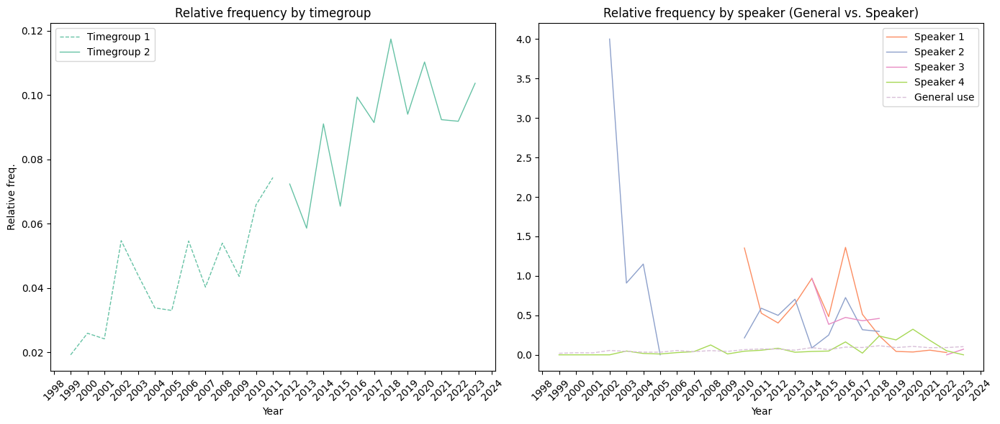

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

target_word = ['bærekraft']

def count_target_word(text, words):
    text = text.lower()
    return sum(text.count(word) for word in words)

speaker_specific = {
    'Diachronic': tg2_df,
    'Speaker 1': speaker1_corp,
    'Speaker 2': speaker2_corp,
    'Speaker 3': speaker3_corp,
    'Speaker 4': speaker4_corp
}

set2 = plt.get_cmap('Set2')
fig, axes = plt.subplots(1, 2, figsize=(14, 6))


color_index = 0
diachronic_color = set2(color_index)
color_index += 1

tg1_df['target_count'] = tg1_df['text'].apply(lambda x: count_target_word(x, target_word))
yearly_counts_tg1 = tg1_df['target_count'].resample('YE').sum()
yearly_totals_tg1 = tg1_df['text'].resample('YE').size()
rel_freq_tg1 = yearly_counts_tg1 / yearly_totals_tg1
axes[0].plot(rel_freq_tg1.index, rel_freq_tg1.values, linestyle='--',
             linewidth=1, label='Timegroup 1', color=diachronic_color)

tg2_df['target_count'] = tg2_df['text'].apply(lambda x: count_target_word(x, target_word))
yearly_counts_tg2 = tg2_df['target_count'].resample('YE').sum()
yearly_totals_tg2 = tg2_df['text'].resample('YE').size()
rel_freq_tg2 = yearly_counts_tg2 / yearly_totals_tg2
axes[0].plot(rel_freq_tg2.index, rel_freq_tg2.values, linestyle='-',
             linewidth=1, label='Timegroup 2', color=diachronic_color)

axes[0].set_title('Relative frequency by timegroup')
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Relative freq.')
axes[0].xaxis.set_major_locator(mdates.YearLocator())
axes[0].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
axes[0].tick_params(axis='x', rotation=45)
axes[0].legend()

idiosyncratic_speakers = [s for s in speaker_specific.keys() if s != 'Diachronic']

for idx, speaker in enumerate(idiosyncratic_speakers, start=1):
    color = set2(color_index)
    color_index += 1

    speaker_df = speaker_specific[speaker].copy()
    speaker_df.set_index('date', inplace=True)
    speaker_df['target_count'] = speaker_df['text'].apply(lambda x: count_target_word(x, target_word))
    yearly_counts_spk = speaker_df['target_count'].resample('YE').sum()
    yearly_totals_spk = speaker_df['text'].resample('YE').size()
    rel_freq_spk = yearly_counts_spk / yearly_totals_spk
    axes[1].plot(rel_freq_spk.index, rel_freq_spk.values, linestyle='-',
                 linewidth=1, label=f'Speaker {idx}', color=color)

    if speaker == 'Speaker 4':
        general_df = general_corp_speaker4.copy()
        general_df.set_index('date', inplace=True)
        general_df['target_count'] = general_df['text'].apply(lambda x: count_target_word(x, target_word))
        yearly_counts_gen = general_df['target_count'].resample('YE').sum()
        yearly_totals_gen = general_df['text'].resample('YE').size()
        rel_freq_gen = yearly_counts_gen / yearly_totals_gen
        axes[1].plot(rel_freq_gen.index, rel_freq_gen.values, linestyle='dashed',
                     linewidth=1, label='General use', color='thistle')



axes[1].set_title('Relative frequency by speaker (General vs. Speaker)')
axes[1].set_xlabel('Year')
axes[1].xaxis.set_major_locator(mdates.YearLocator())
axes[1].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
axes[1].tick_params(axis='x', rotation=45)
axes[1].legend()

plt.tight_layout()
plt.savefig('rel_freq_combined_swapped.png')
plt.show()
